In [1]:
import numpy as np
from scipy.stats import spearmanr
from scipy import sparse
import cmath
from sklearn.decomposition import PCA
import sys, os
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
from matplotlib.pyplot import cm
import matplotlib.patches as patches




sys.path.append('/mnt/e/dhh-soltesz-lab/zfish-proj/src-parallel/operation-figgeritout/comp-modeling/utils')
from futils import read_metrics_filepath, extract_weights, data2percentile, get_hilbert, get_phases, get_synch, jthreshold

font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 22}

matplotlib.rc('font', **font)

%load_ext autoreload
%autoreload 2

In [601]:
fish_id = 2
traces_filepath = '../data/fish-%i-processed.npz' % fish_id
bin_filepath    = '/mnt/f/dhh-soltesz-lab/zfish-fc/f%i/bin' % fish_id
gt_filepath     = '/mnt/f/dhh-soltesz-lab/zfish-fc/f%i/gt' % fish_id
# snap_filepath   = '/mnt/f/dhh-soltesz-lab/zfish-fc/f%i/snap' % fish_id
metrics_filepath = '/mnt/f/dhh-soltesz-lab/zfish-fc/f%i-rolled/graph-metrics' % fish_id

nmatrices = 2380
window = 120
presz_start_idx = 500
sz_start_idx = 1370
#fish 2 - 1370
#fish 3 - 1270
#fish 5 - 2190
#fish 6 - 1360

f = np.load(traces_filepath)
traces = f['traces']
coords = f['coords']
f.close()
N, T = traces.shape
complete_times = np.arange(0, traces.shape[1]) * 0.5
dynamic_times  = complete_times[window:]
print(N,T)

6701 2500


In [603]:
## Extract graph metrics

#metrics_filepath = '/mnt/f/dhh-soltesz-lab/ca1-data/JF_200_105/graph-metrics'
# coords_filepath  = '/mnt/f/dhh-soltesz-lab/zfish-modeling-outputs/f2/baseline/v1/additional-info-3152020.npz'
# f = np.load(coords_filepath)
# coords = f['spatial']

nmatrices=2300
dynamic_degree_centrality, dynamic_eigenvector_centrality, dynamic_clustering_coefficient = read_metrics_filepath(metrics_filepath, nmatrices, [], verbose=True)
dynamic_degree_centrality_percentile, dynamic_eigenvector_centrality_percentile, dynamic_cc_percentile  = [], [], []
method = 'min'

for i in range(len(dynamic_degree_centrality)):
    dynamic_degree_centrality_percentile.append(data2percentile(dynamic_degree_centrality[i], method=method))
    dynamic_eigenvector_centrality_percentile.append(data2percentile(dynamic_eigenvector_centrality[i], method=method))
    dynamic_cc_percentile.append(data2percentile(dynamic_clustering_coefficient[i], method=method))
dynamic_degree_centrality_percentile      = np.asarray(dynamic_degree_centrality_percentile, dtype='float32')
dynamic_eigenvector_centrality_percentile = np.asarray(dynamic_eigenvector_centrality_percentile, dtype='float32')
dynamic_cc_percentile = np.asarray(dynamic_cc_percentile, dtype='float32')

dynamic_ev_deg_correlation = []
for i in range(len(dynamic_degree_centrality_percentile)):
    deg = dynamic_degree_centrality_percentile[i]
    ev  = dynamic_eigenvector_centrality_percentile[i]
    
    rho, _ = spearmanr(deg, ev)
    dynamic_ev_deg_correlation.append(rho)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200


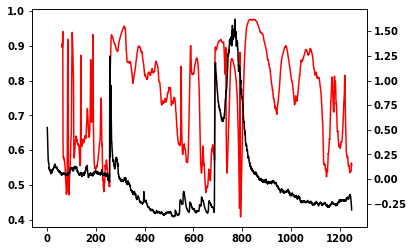

In [509]:
start = 1940
fig, ax = plt.subplots()
ax.plot(dynamic_times, dynamic_ev_deg_correlation, color='r')
ax2 = ax.twinx()
ax2.plot(complete_times, np.mean(traces,axis=0), color='k')
plt.show()


In [558]:
def extract_leiden_modularity(xcorr, res, binary=None, part=None):
    from graph_utils import leiden_clustering
    labels, modularity = leiden_clustering(xcorr , res=res, directed=False, part=part)   
    return labels, modularity
  

# sort and get modularities of 
def get_spatiotemporal_mod(sorted_raster, csz_lst, res=1.0):   
    from sklearn.metrics.pairwise import cosine_similarity
    
    membership = None
    if csz_lst is not None:
        membership = []
        mid = 0
        for sz in csz_lst:
            membership.extend([mid for _ in range(sz)])
            mid += 1  
    
    space = cosine_similarity(sorted_raster)
    slabels, smod = extract_leiden_modularity(space, res=1.0, part=membership)
    return slabels, smod

def extract_ensembles(raster):
    from futils import ensemble_detection
  
    ensemble_kwargs = {'metric': 'cosine', 'k': 20, 'stopping_condition': 1e-3, 'resolution': 1.0}
    sam, umap_data, cluster_labels = ensemble_detection(raster, run_sam=True, **ensemble_kwargs)
    return sam, umap_data, cluster_labels


def rasterize(idxs, component, temporal_cutoff=0.50, spatial_cutoff=0.90):
    raster = []
    times = list(range(0,360))+list(range(620,sz_start_idx-120))
    for i in idxs:
        d, e = dynamic_degree_centrality_percentile[i], dynamic_eigenvector_centrality_percentile[i]
        locs = None
        if component == 'shubs':
            locs = np.where( (d > spatial_cutoff) & (e > spatial_cutoff))[0]
        elif component == 'nhubs':
            locs = np.where(d > spatial_cutoff)[0]
        elif component == 'hubs':
            locs = np.where( (d > spatial_cutoff) & (e <= spatial_cutoff) )[0]
        raster_slice = np.zeros(len(d), dtype='uint8')
        raster_slice[locs] = 1
        raster.append(raster_slice)
    raster = np.asarray(raster, dtype='uint8')      
    
    valid_idxs = None
    if temporal_cutoff is not None:
        raster_mean = np.mean(raster, axis=0)
        mean_cutoff = np.percentile(raster_mean, 100.*temporal_cutoff)
        valid_idxs = np.where(raster_mean > mean_cutoff)[0]
        raster = raster[:, valid_idxs]

    return np.asarray(raster, dtype='uint8'), valid_idxs

def sort_dstructure(raster, labels, dtype='uint8', tpose=False):
    labels = np.asarray(labels, dtype='uint32')
    label_set = list(set(labels))
    sorted_raster = np.zeros_like(raster, dtype=dtype)
    
    csz_lst = []
    for label in label_set:
        idxs = np.where(labels == label)[0]
        csize = len(idxs)
        csz_lst.append(csize)
        
    sorted_idxs = np.argsort(csz_lst)[::-1]
    count = 0
    for idx in sorted_idxs:
        idxs = np.where(labels == label_set[idx])[0]
        csz = len(idxs)
        sorted_raster[:,count:count+csz] = raster[:, idxs]
        count += csz
    if tpose:
        sorted_raster = sorted_raster.T
    return sorted_raster, np.sort(csz_lst)[::-1]


def run_algo(start, stop, temporal_cutoff, dtype='uint8', verbose=False):
    superhub_raster, superhub_valid_idxs = rasterize(range(start,stop), 'shubs', temporal_cutoff=temporal_cutoff)
    dd = superhub_raster
    _, _, superhub_slabels = extract_ensembles(dd.T) # get assemblies
    _, _, superhub_tlabels = extract_ensembles(dd) # get temporal states
    
    superhub_spatial_sorted_raster, csz_spatial_lst         = sort_dstructure(dd, superhub_slabels, dtype=dtype, tpose=False)
    superhub_spatiotemporal_sorted_raster, csz_temporal_lst = sort_dstructure(superhub_spatial_sorted_raster.T, superhub_tlabels, dtype=dtype, tpose=True)
    
    slabels, smod = get_spatiotemporal_mod(superhub_spatiotemporal_sorted_raster.T, csz_spatial_lst)
    tlabels, tmod = get_spatiotemporal_mod(superhub_spatiotemporal_sorted_raster, csz_temporal_lst)
    if verbose:
        print(smod, tmod, len(slabels))
    return {'raster': dd, 'csz_spatial_lst':csz_spatial_lst, 'csz_temporal_lst':csz_temporal_lst,
                                    'sorted raster': superhub_spatiotemporal_sorted_raster, 'valid idxs': superhub_valid_idxs,
                                   'slabels': slabels, 'smod': smod, 
                                    'tlabels': tlabels, 'tmod': tmod,
                                       'oslabels': superhub_slabels, 'otlabels': superhub_tlabels}


# def run_algo2(start, stop, temporal_cutoff, dtype='uint8', verbose=False):
#     superhub_raster, superhub_valid_idxs = rasterize(range(start,stop), 'shubs', temporal_cutoff=temporal_cutoff)
#     dd = superhub_raster
#     _, _, superhub_slabels = extract_ensembles(dd.T) # get assemblies    
#     return superhub_raster, superhub_valid_idxs, superhub_slabels


In [604]:
rolled = run_algo(0,240, temporal_cutoff=0.80, dtype='uint8', verbose=True)

Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10643610417400863 0.17374944782534105 1321


In [577]:
baseline_superhub_outputs = {}

# # T x N 
for i in range(0, 360-240, 5):
    baseline_superhub_outputs[i] = run_algo(i, i+240, temporal_cutoff=0.80, dtype='uint8', verbose=True)
    print(i)

#baseline_superhub_outputs[0] = run_algo(25, 240+25, temporal_cutoff=0.80, dtype='uint8', verbose=True)



Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10435675520450832 0.2020128609051349 1318
0


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11737309860202694 0.21158048151909126 1330
5


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10591859130428145 0.21688098562400743 1328
10


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10349238188588948 0.2443467573921514 1314
15


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1043837144444874 0.24748549662412003 1306
20


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10995176262768666 0.2100172753067281 1319
25


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10369565167645703 0.2093024249357519 1305
30


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11270205782593865 0.19311076784130318 1323
35


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10990630004622592 0.19121816875491016 1318
40


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10666973874560207 0.19074178748465767 1332
45


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10622393865544916 0.22496035124368646 1323
50


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10608514066585296 0.22578188630009347 1336
55


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11653699192438789 0.22448847549055112 1335
60


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10019484244659375 0.2281503496504984 1317
65


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10517990012249195 0.229774831841417 1321
70


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12050561359101593 0.22869115534614298 1319
75


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10572484210914856 0.231856604298503 1335
80


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11846819146938405 0.24035327335695952 1323
85


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10881691241216863 0.24162957126561718 1310
90


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11620640198253492 0.2461511832245378 1320
95


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10698440802787638 0.27471865190150985 1328
100


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11738252570988335 0.2531853339326833 1301
105


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11762994887688515 0.2536590396383534 1330
110


Transforming to str index.
Transforming to str index.


0.1272448706478702 0.25384087293408125 1323
115


0.17374944782534105 0.10643610417400863


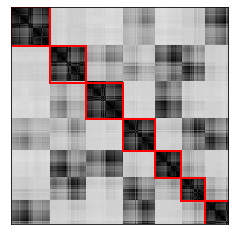

1321 (1321, 1321)


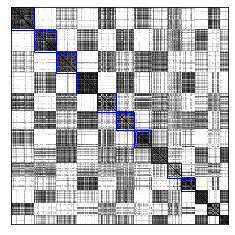

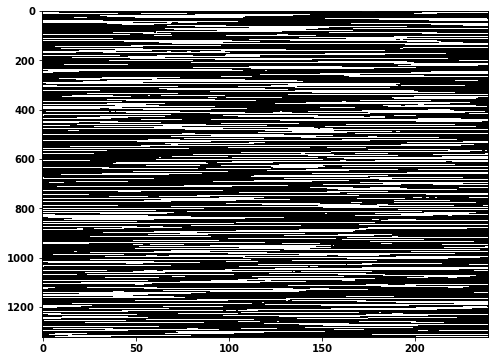

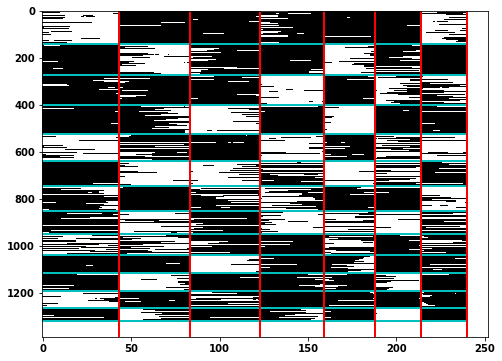

In [605]:
def plot_data(X, k, duration):
    from sklearn.metrics.pairwise import cosine_similarity
    raster        = X['raster']
    sorted_raster = X['sorted raster']
    csz_spatial_lst = X['csz_spatial_lst']
    csz_temporal_lst = X['csz_temporal_lst']
    
    print(X['tmod'], X['smod'])
       
    time = cosine_similarity(sorted_raster)
    tlabels = X['tlabels']
    tlabel_idxs = np.argsort(tlabels)
    time = time[tlabel_idxs,:]; time = time[:, tlabel_idxs]
    fig, ax = plt.subplots()
    ax.imshow(time, cmap='gray_r', vmin=0., vmax=1.)
    count = 0
    for sz in csz_temporal_lst:
        p = patches.Rectangle((count, count), sz, sz, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(p)
        count += sz 
    ax.set_xticks([])
    ax.set_yticks([])
    plt.show()
    
    space = cosine_similarity(sorted_raster.T)
    slabels = X['slabels']
    print(len(slabels), space.shape)
    slabel_idxs = np.argsort(slabels)
    space = space[slabel_idxs,:]; space = space[:, slabel_idxs]
    
    fig, ax = plt.subplots()
    plt.imshow(space, vmin=0., vmax=1., cmap='gray_r')
    count = 0
    for sz in csz_spatial_lst:
        p = patches.Rectangle((count, count), sz, sz, linewidth=1, edgecolor='b', facecolor='none')
        ax.add_patch(p)
        count += sz 
    ax.set_xticks([])
    ax.set_yticks([])
    plt.show()     
    
    
    fig, ax = plt.subplots(figsize=(8,6))
    ax.imshow(raster.T, cmap='gray', aspect='auto')
    ax2 = ax.twinx()
    #ax2.plot(np.divide(tlabels,float(np.max(tlabels))), color='r', linewidth=4)
    #ax2.plot(dynamic_ev_deg_correlation[k:k+duration], color='b', linewidth=4)
    ax2.set_yticks([])
    plt.show()
    
    fig, ax = plt.subplots(figsize=(8,6))
    ax.imshow(sorted_raster.T, cmap='gray', aspect='auto')
    count = 0
    for sz in csz_spatial_lst:
        count += sz
        ax.hlines(count, 0, raster.shape[0], color='C', linewidth=2)
    count = 0
    for sz in csz_temporal_lst:
        count += sz
        ax.axvline(count, 0, raster.shape[1], color='r', linewidth=2)
    plt.show()
    
key = 0
plot_data(rolled, key, 360)


In [578]:
presz_superhub_outputs = {}

# T x N 
for i in range(620, sz_start_idx-120-240, 5):
    presz_superhub_outputs[i] = run_algo(i, i+240, temporal_cutoff=0.80, verbose=True)
    print(i)





Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09035195621206471 0.22260011965070786 1339
620


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.0980759013123859 0.2222065248283823 1331
625


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10348644679534252 0.2186460474069452 1296
630


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11401929722932024 0.22301247591625262 1315
635


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11099264642426919 0.22574323606120358 1324
640


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10073563475286837 0.25117918123920396 1329
645


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11420933330057487 0.2511370867508892 1320
650


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1054533267262387 0.24922656918431985 1306
655


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09966942647988014 0.2179108647486939 1320
660


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10116553424494937 0.21697992368709967 1338
665


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10055816107809329 0.21116422254124473 1307
670


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11032322210027407 0.21111803274264254 1323
675


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11651914536280751 0.21166060575693654 1324
680


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11395481266612392 0.2183859289901306 1336
685


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10508502452741855 0.20911695453126045 1316
690


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12776520646576248 0.219131374270644 1330
695


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12004145450889658 0.21649082766536387 1335
700


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12411740947833069 0.22141974133347184 1334
705


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12666057945554587 0.2190988292055665 1331
710


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12058105429279237 0.23777350256168236 1326
715


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1052105221676291 0.2418575609031793 1311
720


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10594097803929253 0.23555994359130866 1332
725


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11056813158477606 0.23334297425601613 1320
730


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11621558398206658 0.23474330092240484 1296
735


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12376922700790988 0.2399643741023289 1327
740


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1180337892908203 0.2409318767720023 1314
745


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11308773277602006 0.23329806735987826 1317
750


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11339103019226726 0.23169973172336097 1317
755


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12418848767772218 0.2339686174049287 1322
760


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12566551379321117 0.23802168976495772 1327
765


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1241637761584959 0.2389858897229721 1331
770


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12691804865364834 0.2397222072068679 1330
775


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11034081801337926 0.21726953672866756 1321
780


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1174055525483153 0.21802565435385776 1308
785


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10584863630045192 0.21739446987481115 1338
790


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11078631260084296 0.2363569722785637 1334
795


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10757720723602929 0.2345384271830337 1321
800


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1140509895516709 0.2271581789264973 1294
805


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11168601508432685 0.2166928750246807 1328
810


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1092281345499292 0.22399088452596172 1318
815


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11117585325562103 0.22382921806501155 1303
820


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1291842865617485 0.22656963455598803 1332
825


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11795425196742708 0.2416816287939054 1312
830


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12432024865173638 0.24935061573805906 1313
835


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12834844396778253 0.25766152612547094 1304
840


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1281019238124176 0.23068706205724873 1309
845


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11800024707870548 0.240827757886555 1312
850


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12424423523365234 0.24161061738103864 1324
855


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.14378052057787355 0.2368000549493402 1320
860


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11637346266015133 0.2241471536995499 1308
865


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12366336968978275 0.24875013175105903 1303
870


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12247699659775318 0.2506453013236193 1332
875


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11587145185136172 0.24639038806436273 1336
880


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.13611321362977846 0.24077416138829758 1312
885


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1316895119682363 0.25058208494422196 1300
890


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.13538043024338964 0.2507046997078853 1334
895


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11121055953203053 0.2289425830621699 1306
900


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11252179579824993 0.23037900424158939 1315
905


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12643546857351676 0.2346910957161893 1323
910


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.13973723775309194 0.2325632150305697 1332
915


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12505847320833918 0.23986639916226746 1301
920


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12293891664435946 0.2454749646397221 1312
925


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.14371887048377924 0.24686686441762243 1329
930


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12701536508546135 0.253406672438062 1314
935


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1329522719833327 0.24573825868475485 1331
940


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11280672274338507 0.22596055193140038 1304
945


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12730603466397863 0.2107693064663529 1294
950


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11456685503481889 0.2148436329449867 1297
955


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12707262427812924 0.2158906875129476 1324
960


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11042860756002526 0.21191567066760153 1306
965


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11052100575220208 0.22495025247311823 1300
970


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11365251682645273 0.22231740966700042 1302
975


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1156239130465765 0.21013748388543896 1299
980


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11449066314325979 0.24394860361248039 1290
985


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11754700593139399 0.24341495863535792 1336
990


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1118358854121467 0.22513449745588346 1319
995


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10148267482826354 0.21498704293009327 1303
1000


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10283163977838967 0.1962932414779671 1302
1005


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09231151644286495 0.20997998037909335 1307
1010


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09201250250756635 0.18743123577467008 1302
1015


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09564266432281987 0.21243621952069233 1307
1020


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10717792582932337 0.2005640255777909 1310
1025


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10391293122272903 0.21892304433999019 1310
1030


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10373181890715397 0.22289331159139536 1311
1035


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11855382982612776 0.22995530701190056 1321
1040


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11976912462221667 0.24630360969691975 1324
1045


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12084111664064981 0.21395155049427597 1330
1050


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11876236360072323 0.2192822509943126 1314
1055


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11204296328368801 0.21789896048823018 1337
1060


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.0982366968433611 0.21462396526150304 1310
1065


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1029798789064159 0.19856728822937253 1328
1070


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10340967514471913 0.21867639141437037 1334
1075


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1046137068919659 0.21743830503068154 1318
1080


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10973053638564756 0.23545782383114805 1325
1085


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10460027011415644 0.2337478404195834 1316
1090


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10454720847734379 0.20691181374323672 1336
1095


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10769773037603894 0.20869657925469165 1332
1100


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10625296734877729 0.20213201666684652 1329
1105


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10239644157947397 0.1987427050635243 1338
1110


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10826349022771818 0.19845791895227158 1337
1115


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10429575440092692 0.19351206121918982 1316
1120


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10599473059437725 0.20545492219639624 1333
1125


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12641359851756148 0.2005577965156406 1324
1130


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10943548021183977 0.19819102249852596 1320
1135


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11029968507087015 0.1983500419777464 1324
1140


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10916571627485455 0.1970156420429141 1313
1145


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10997750609269033 0.19808832402464321 1312
1150


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10102128333041181 0.19772215252216188 1326
1155


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09757999147886967 0.19312924735578635 1335
1160


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09941763520931007 0.19270236902503574 1339
1165


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10220546169036215 0.1940459829337613 1320
1170


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10612305540849126 0.21700803984047154 1307
1175


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11769025027823342 0.22199809361939465 1304
1180


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11478335504621369 0.218223893200547 1280
1185


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12128371205446256 0.23417911499239874 1328
1190


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1344336888765654 0.22268201960805287 1333
1195


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1346761542450059 0.218558797129539 1308
1200


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11779122904655222 0.21429325817200387 1313
1205


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12529662910615905 0.21194565348687058 1297
1210


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1254801624397691 0.21703087596882475 1306
1215


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12218770173841881 0.21433984312415053 1319
1220


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12874921568915984 0.2188991970120145 1329
1225


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.13934819407836685 0.22320544783501622 1302
1230


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.13939649607060287 0.22654141981136555 1305
1235


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1427990955796403 0.23268850977681063 1319
1240


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.13817311093767506 0.24281545935502363 1334
1245


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.13653491394775613 0.24944263772605715 1316
1250


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12899159325985163 0.24290157332633294 1257
1255


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.14007109901081075 0.2517121044011533 1299
1260


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.13390959306690525 0.24483002350007693 1323
1265


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1216868432562267 0.2683707413221518 1261
1270


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1146906740254456 0.27459629458429147 1279
1275


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12535318236344586 0.2793586313456914 1296
1280


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1316796979649127 0.26322681936103115 1302
1285


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.14710682491369906 0.2649386949890454 1295
1290


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1423074743790854 0.2654848776254588 1300
1295


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.14324015546606184 0.2632756281622659 1318
1300


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.136914763128424 0.28147284513496734 1329
1305


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.14415436931133707 0.275922731577479 1328
1310


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.14132773427158793 0.2650890073306066 1322
1315


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11804513651337928 0.260363055938965 1314
1320


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12461453368346097 0.25923162032973407 1314
1325


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.12855032146079406 0.2531556835258988 1307
1330


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1277393377981889 0.2724516786600644 1337
1335


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11782479799868882 0.25427760745279504 1322
1340


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10489379657854866 0.27429281347097295 1313
1345


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11192882833258792 0.27322001361079395 1305
1350


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09458115906228619 0.2322034894699163 1282
1355


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1074334069829671 0.22757726512096849 1337
1360


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10296657188571397 0.21994508318650222 1332
1365


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10937249429839957 0.22403344416799603 1327
1370


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09711336031619124 0.1990161802041898 1310
1375


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.0956229593811432 0.20569274821790579 1292
1380


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09441940715404319 0.18626215136482335 1328
1385


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08951998890094848 0.17553623635769666 1252
1390


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09597863530519041 0.16811989503726318 1312
1395


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08691574060736733 0.14891853297070284 1309
1400


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09167078570124251 0.1509017876733231 1338
1405


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08131425304271149 0.15181136988689214 1306
1410


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08090615158201864 0.1352880464130763 1304
1415


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08278709732012966 0.130558348724589 1336
1420


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08312942656393968 0.12606356990534703 1332
1425


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08082284349147423 0.12445141487673876 1315
1430


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08228229986926004 0.12855814069181704 1314
1435


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07515950232005014 0.12574050290302197 1312
1440


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09150542084493675 0.1256822402655602 1314
1445


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09425535477667973 0.12365060770019043 1329
1450


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08875158273311491 0.11373346836574101 1321
1455


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07387599263610876 0.10956981399696197 1308
1460


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08711547940947295 0.12246793387719651 1309
1465


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07664497207133898 0.11894941323083691 1311
1470


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.0816334501687252 0.11806327639844932 1324
1475


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07827123329420478 0.1172233087164728 1334
1480


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.0800344796429959 0.1173737615604038 1335
1485


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07957421227954219 0.1343028770430741 1339
1490


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.0747454071436767 0.11801703768735956 1322
1495


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.077578042839269 0.11642253539340386 1338
1500


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.06933964115799915 0.11305361628095693 1313
1505


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07182417267071554 0.11589802063908525 1329
1510


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07100475151882328 0.11865376592395173 1329
1515


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08443050946464509 0.12281417036953422 1332
1520


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08414667818635782 0.13289906691081568 1336
1525


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09118470195526136 0.12948875311532781 1335
1530


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08290389747913457 0.1275640294466287 1330
1535


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08482594266173386 0.14016433794714356 1338
1540


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08821512546942624 0.13901625037047424 1338
1545


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08167440298679099 0.14872432935841967 1332
1550


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07677055935558742 0.16478875541285543 1286
1555


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10912539360581083 0.1841309575985837 1331
1560


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.0986478424668371 0.1912634961626864 1337
1565


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09581419929869633 0.18996980818884301 1328
1570


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10185667235845242 0.20182213819347816 1333
1575


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10211249464925395 0.19851875119800172 1333
1580


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10296162940252923 0.1892360119025544 1315
1585


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10119715025454283 0.20064160947316953 1316
1590


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09935510541760573 0.20345336549428006 1326
1595


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10029835437328523 0.2238441915943442 1309
1600


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09705879507281207 0.2134958194420442 1337
1605


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09209701587558343 0.21335033589672298 1319
1610


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09525087105056018 0.2141450811386518 1327
1615


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09719000027089354 0.21413465346165192 1320
1620


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.1026280382490608 0.21502356178567553 1324
1625


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.0948397757080908 0.2065969378716171 1313
1630


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10470080537785838 0.20853668736520808 1336
1635


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10024084693321662 0.20721158456596667 1327
1640


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.11061479917283153 0.2178829492797025 1307
1645


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09646285125281862 0.20562497905454866 1327
1650


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10627654348023508 0.20226549579019934 1324
1655


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09130278821868272 0.19453488076592634 1290
1660


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09757261002427216 0.19345189000651064 1320
1665


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.10033965143310357 0.1781151442531055 1313
1670


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09357852380833684 0.17659948592635374 1334
1675


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09884872745977263 0.177254648506383 1326
1680


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08632973563401508 0.1731445619789972 1322
1685


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09055131971674578 0.17130001475532186 1325
1690


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09173537724214567 0.1665562412024889 1331
1695


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.097257341051066 0.1557961840211062 1317
1700


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07933782639742043 0.13589754921289607 1314
1705


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.087128777129889 0.1603736278635133 1329
1710


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08220158223091922 0.153743749971465 1334
1715


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08406101556931544 0.12359530182198446 1339
1720


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.0923257967500768 0.12029396353863808 1320
1725


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.09272462694932812 0.12809561209970113 1314
1730


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.0826292797818252 0.12507332424943107 1326
1735


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07534940585783961 0.11998081008749648 1319
1740


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07944238556612479 0.1191727400537256 1338
1745


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07614775855271784 0.1153534322788999 1332
1750


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08240971361677955 0.11454006222166252 1325
1755


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.0820031260483961 0.11781453179750183 1309
1760


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.0861404474246274 0.12274048415766942 1335
1765


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07511607310131661 0.1142014273507105 1324
1770


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07207290352660886 0.11936037156452599 1325
1775


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07134348228819988 0.10617740611999466 1328
1780


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07045674076734636 0.10411779405932728 1310
1785


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07565291864023527 0.10462872706864353 1322
1790


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07955451197795772 0.10288034384671249 1322
1795


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08520137390468505 0.10407643005806091 1330
1800


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08700329341543664 0.11202506709754699 1331
1805


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.08951084085572471 0.10945758685325561 1335
1810


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.0798175537617907 0.11796904695645506 1338
1815


Transforming to str index.
Transforming to str index.
Transforming to str index.
Transforming to str index.


0.07437566890604191 0.1260109413370028 1329
1820


Transforming to str index.
Transforming to str index.


0.07978006983490935 0.14020578637061004 1311
1825


In [595]:
# np.savez('f5-base-50.npz', data=baseline_superhub_outputs)
# np.savez('f5-pre-50.npz', data=presz_superhub_outputs)

import pickle

#pickle.dump( presz_superhub_outputs, open( "f5-pre-80.pkl", "wb" ) )
#pickle.dump( baseline_superhub_outputs, open( "f5-base-80.pkl", "wb" ) )

baseline_superhub_outputs = pickle.load( open( "f5-base-80.pkl", "rb" ) )
presz_superhub_outputs = pickle.load( open( "f5-pre-80.pkl", "rb" ) )



0.20869657925469165 0.10769773037603894


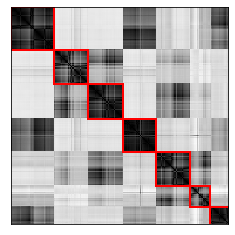

1332 (1332, 1332)


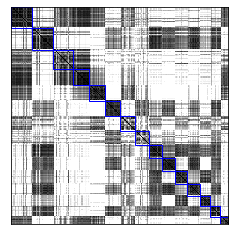

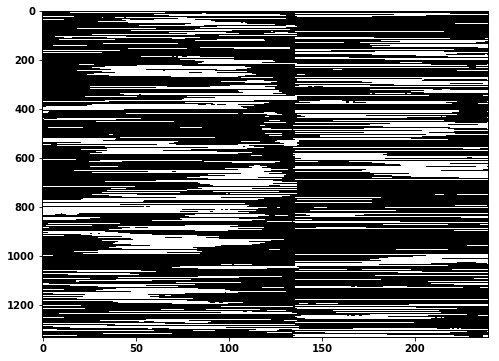

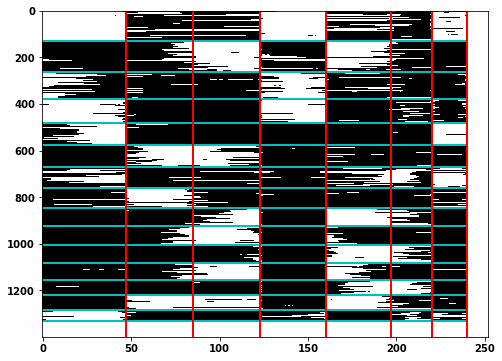

In [598]:
key = 1100 #1100,1600
plot_data(presz_superhub_outputs[key], key, 300)


0.21649082766536387 0.22808077445052044 0.20647585484732195


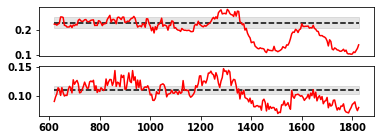

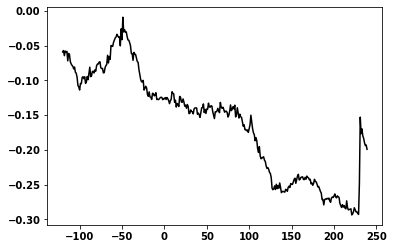

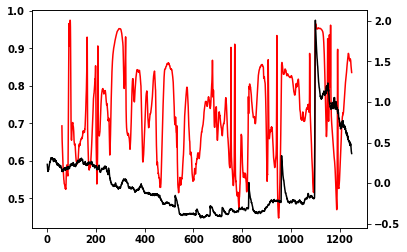

In [596]:

btmods = []
for key in np.sort(list(baseline_superhub_outputs.keys())):
    btmods.append(baseline_superhub_outputs[key]['tmod'])
btmean, btstd = np.mean(btmods), np.std(btmods)

ptmods = []
for key in np.sort(list(presz_superhub_outputs.keys())):
    ptmods.append(presz_superhub_outputs[key]['tmod'])


### space

bsmods = []
for key in np.sort(list(baseline_superhub_outputs.keys())):
    bsmods.append(baseline_superhub_outputs[key]['smod'])
bsmean, bsstd = np.mean(bsmods), np.std(bsmods)

psmods = []
for key in np.sort(list(presz_superhub_outputs.keys())):
    psmods.append(presz_superhub_outputs[key]['smod'])
pkeys = np.sort(list(presz_superhub_outputs.keys()))
fix, ax = plt.subplots(2,1,figsize=(6,2))
ax[0].plot(pkeys, [btmean for _ in ptmods], color='k', linestyle='--')
ax[0].fill_between(pkeys, btmean - 1.*btstd, btmean+1.*btstd, color='k', alpha=0.1)
ax[0].plot(pkeys,ptmods, color='r')
ax[0].set_xticks([])
ax[1].plot(pkeys, [bsmean for _ in psmods], color='k', linestyle='--')
ax[1].fill_between(pkeys, bsmean - 1.*bsstd, bsmean+1.*bsstd, color='k', alpha=0.1)
ax[1].plot(pkeys,psmods, color='r')


# 1100
start = 700
print(presz_superhub_outputs[start]['tmod'], btmean, btmean-btstd)

fig, ax = plt.subplots()
ax.plot(np.arange(-120, 240), np.mean(traces,axis=0)[start:start+240+120], color='k')
#ax2 = ax.twinx()
#ax2.plot(dynamic_ev_deg_correlation[start:start+300], color='r')

plt.show()


fig, ax = plt.subplots()
ax.plot(dynamic_times, dynamic_ev_deg_correlation, color='r')
ax2 = ax.twinx()
ax2.plot(complete_times, np.mean(traces,axis=0), color='k')
plt.show()


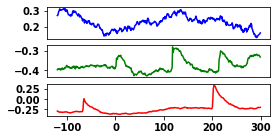

In [583]:
def plot_traces(starts, duration, colors):
    mt = np.mean(traces,axis=0)
    fig, ax = plt.subplots(len(colors),1, figsize=(4,2))
    for i in range(len(colors)):
        cstart = starts[i]
        ccolor = colors[i]
        
        ax[i].plot(np.arange(-120,duration), mt[cstart:cstart+duration+120], color=ccolor)
        if i < len(colors) - 1:
            ax[i].set_xticks([])
        

plot_traces([25, 1100, 1600], 300, ['b', 'g', 'r'])

In [350]:
def plot_superhub_subnetworks(spatial_coords, traces, key, valid_idxs, sorted_idxs, raster, cluster_ids, view, colors=None, plot=True):
    #sorted_spatial_coords, _ = sort_dstructure(coords[superhub_valid_idxs,:].T, superhub_slabels, dtype='uint8', tpose=True)

    cluster_ids = np.asarray(cluster_ids, dtype='uint32')
    cluster_id_set = np.sort(list(set(cluster_ids)))
    valid_spatial_coords = spatial_coords[valid_idxs,:]
    valid_spatial_coords, _ = sort_dstructure(valid_spatial_coords.T, sorted_idxs, dtype='float32', tpose=True)
    valid_traces = traces[valid_idxs, :]
    valid_traces, _ = sort_dstructure(valid_traces.T, sorted_idxs, dtype='float32', tpose=True)

    if colors is None:
        colors = cm.Dark2(np.linspace(0,1,len(cluster_id_set)))

    sactive_szs = []
    for cid in cluster_id_set:
        ts = np.where(cluster_ids == cid)[0]
        reduced_raster = raster[ts, :]
        tactive, sactive = np.where(reduced_raster == 1)
        sactive = list(set(sactive))
        sactive_szs.append(len(sactive))
    
    nneurons = []
    for cid in np.argsort(sactive_szs)[::-1]:
        ts = np.where(cluster_ids == cid)[0]
        reduced_raster = raster[ts, :]
        tactive, sactive = np.where(reduced_raster == 1)
        sactive = list(set(sactive))
        nneurons.append(len(sactive))
        if plot:
            duration=120
            fig = plt.figure(figsize=(12,8))
            ax = plt.axes(projection='3d')
            ax.scatter(*coords.T, color='k', alpha=0.05)
            ax.scatter(*valid_spatial_coords[sactive,:].T, color=colors, alpha=1.0)
            ax.view_init(view[0], view[1])
            plt.show()
            mean_trace = np.mean(valid_traces,axis=0)
            state_traces = valid_traces[sactive,key:key+duration+120]
            fig, ax = plt.subplots(figsize=(8,2))
            ax.plot(np.arange(-120, duration), state_traces[0:25,:].T, color=colors, alpha=0.15)
            ax2 = ax.twinx()
            ax2.plot(np.arange(-120,duration), np.mean(state_traces,axis=0), color=colors, linewidth=4)
            ax2.plot(np.arange(-120, duration), mean_trace[key:key+duration+120], color='k', linewidth=2, alpha=0.5)
    return nneurons
    


def plot_ensembles(spatial_coords, traces, key, valid_idxs, sorted_idxs, raster, cluster_ids, view, colors=None, plot=True):
    cluster_ids = np.asarray(cluster_ids, dtype='uint32')
    cluster_id_set = np.sort(list(set(cluster_ids)))
    valid_spatial_coords = spatial_coords[valid_idxs,:]
    valid_spatial_coords, _ = sort_dstructure(valid_spatial_coords.T, sorted_idxs, dtype='float32', tpose=True)   
    valid_traces = traces[valid_idxs]
    valid_traces, _ = sort_dstructure(valid_traces.T, sorted_idxs, dtype='float32', tpose=True)
    if colors is None:
        colors = cm.Dark2(np.linspace(0,1,len(cluster_id_set)))
    

    nneurons = []
    distances = []
    for cid in cluster_id_set:
        sactive = np.where(cluster_ids == cid)[0]
        ensemble_coords = valid_spatial_coords[sactive]
        xmean, ymean, zmean = np.mean(ensemble_coords[:,0]), np.mean(ensemble_coords[:,1]), np.mean(ensemble_coords[:,2])
        
        cds = []
        for ec_x,ec_y,ec_z in ensemble_coords:
            d = np.sqrt( (xmean - ec_x) ** 2 + (ymean - ec_y) ** 2 + (zmean - ec_z) ** 2)
            cds.append(d)
        distances.append(np.std(cds))
        
        duration=300
        nneurons.append(len(sactive))
        if plot:
            fig = plt.figure(figsize=(12,8))
            ax = plt.axes(projection='3d')
            ax.scatter(*coords.T, color='k', alpha=0.05)
            ax.scatter(*valid_spatial_coords[sactive,:].T, color=colors, alpha=1.0)
            ax.view_init(view[0], view[1])
            plt.show()

            mean_trace = np.mean(valid_traces,axis=0)
            state_traces = valid_traces[sactive,key:key+duration+120]
            normalized_state_traces = []
            for trace in state_traces:
                ct = trace - np.min(trace)
                ct /= np.max(ct)
                normalized_state_traces.append(ct)
            normalized_state_traces = np.asarray(normalized_state_traces, dtype='float32')
            
            print(len(sactive))
            fig, ax = plt.subplots(figsize=(8,2))
            ax.plot(np.arange(-120, duration), normalized_state_traces[0:25,:].T, color=colors, alpha=0.15)
            ax2 = ax.twinx()
            ax2.plot(np.arange(-120, duration), mean_trace[key:key+duration+120], color='k', linewidth=2)
    return nneurons, distances


In [588]:

def raster_assembly_sparsity(raster, labels, cutoff=0.50):
    labels = np.asarray(labels)
    T, N = raster.shape
    sparsity_lst = []
    for t in range(T):
        count = 0
        active_assemblies = 0
        for label in set(labels):
            idxs = np.where(labels == label)[0]
            current_assembly = raster[t,idxs]
            if np.sum(current_assembly)/float(len(idxs)) > cutoff: active_assemblies += 1
        sparsity_lst.append(active_assemblies / float(len(set(labels))))
    return np.asarray(sparsity_lst, dtype='float32')


def extract_subnetwork_data(X, key, cutoff=0.50):
    neurons_per_subnetwork = plot_superhub_subnetworks(coords, traces, key, X[key]['valid idxs'], X[key]['oslabels'],
                                                      X[key]['sorted raster'], X[key]['tlabels'], [90,0],
                                                      colors='b', plot=False)
    neurons_per_assembly, assembly_distances = plot_ensembles(coords, traces, key, X[key]['valid idxs'], X[key]['oslabels'],
                                                      X[key]['sorted raster'], X[key]['tlabels'], [90,0],
                                                      colors='b', plot=False)
    
    sparsity = raster_assembly_sparsity(X[key]['sorted raster'], X[key]['slabels'], cutoff=cutoff)
    
    
    
    return neurons_per_subnetwork, neurons_per_assembly, assembly_distances, sparsity



keys = [25, 1100, 1600]
cutoff =0.75
for key in keys:
    if key <= 360:
        subnetwork_data[key] = extract_subnetwork_data(baseline_superhub_outputs, key, cutoff=cutoff)
    else:
        subnetwork_data[key] = extract_subnetwork_data(presz_superhub_outputs, key, cutoff=cutoff)
    print(key)

25
1100
1600


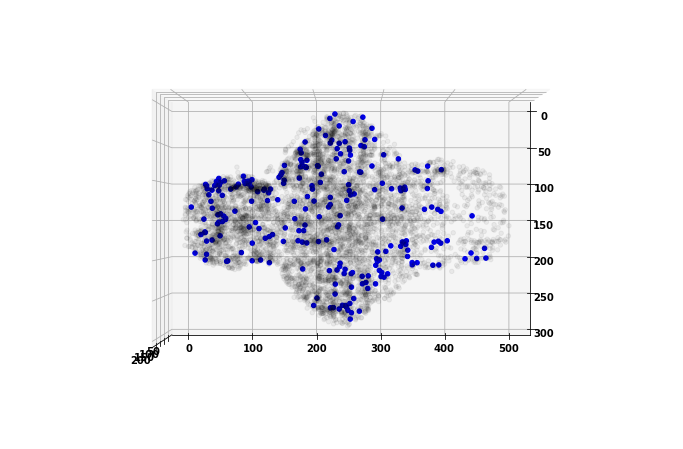

234


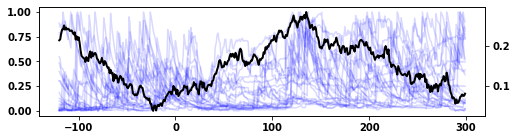

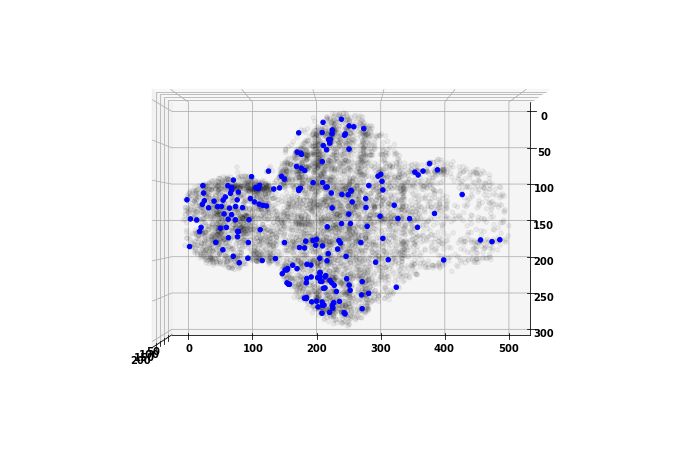

200


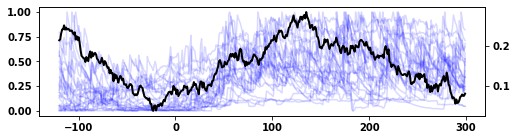

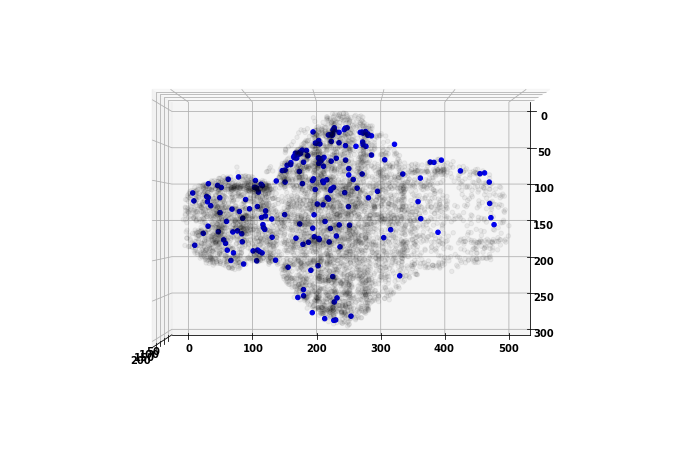

194


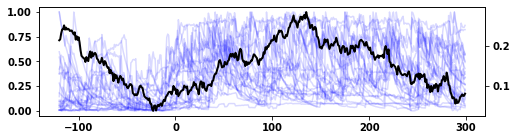

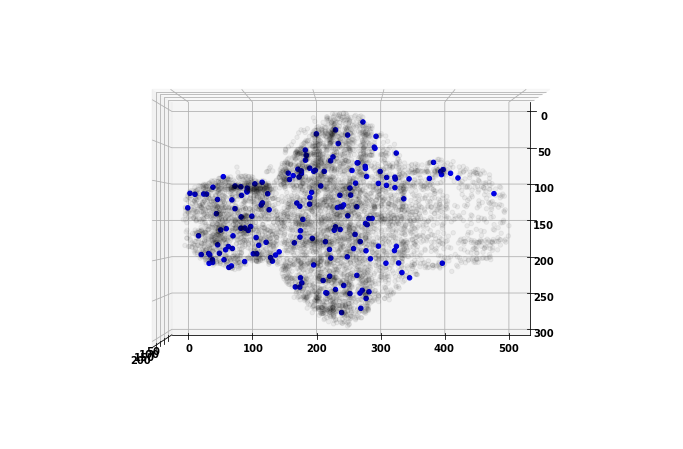

169


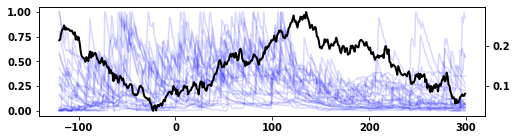

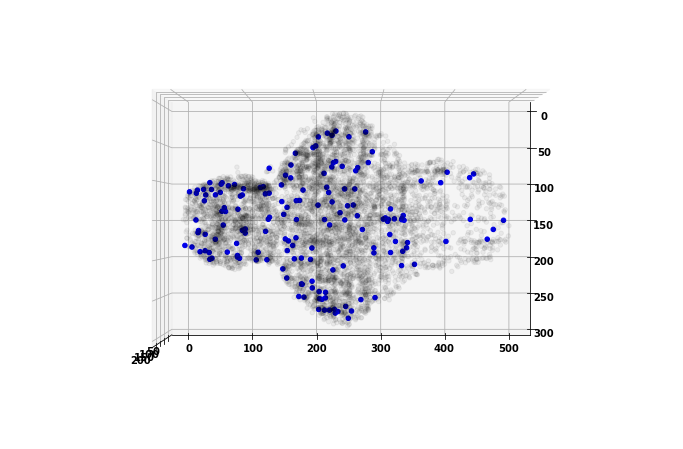

162


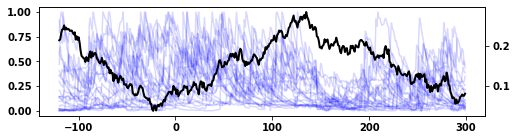

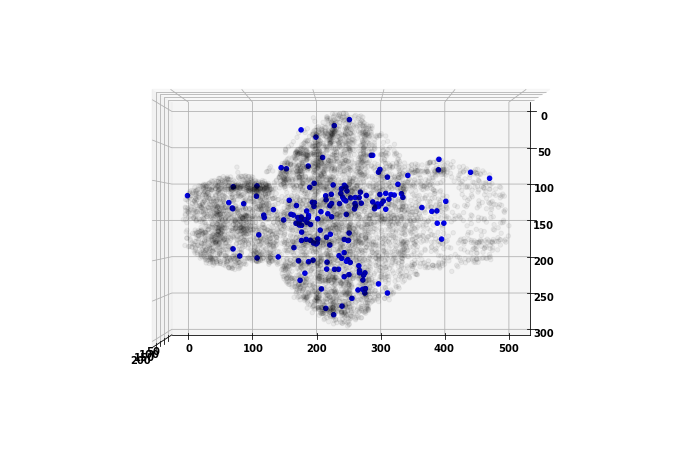

161


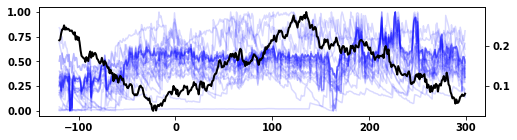

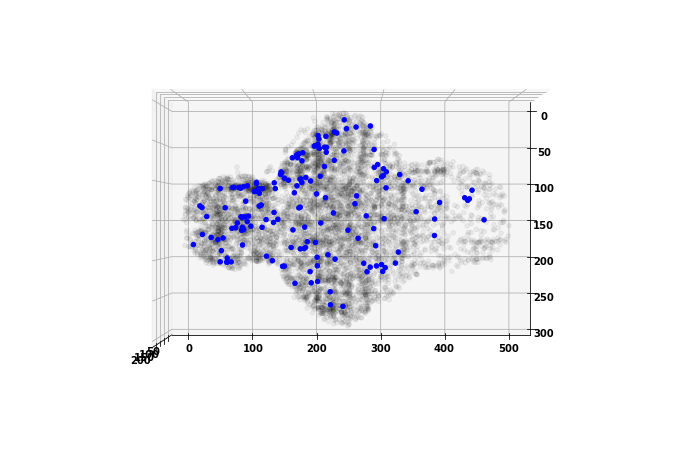

159


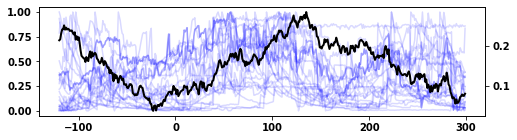

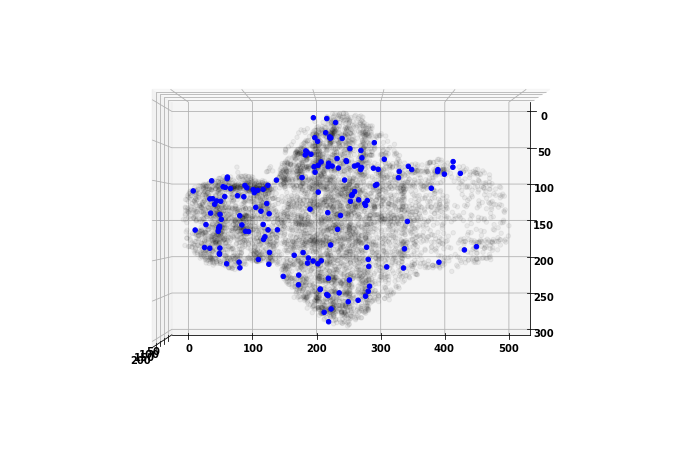

156


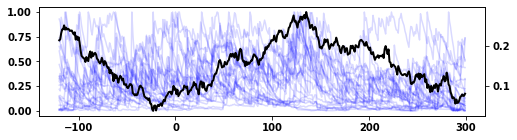

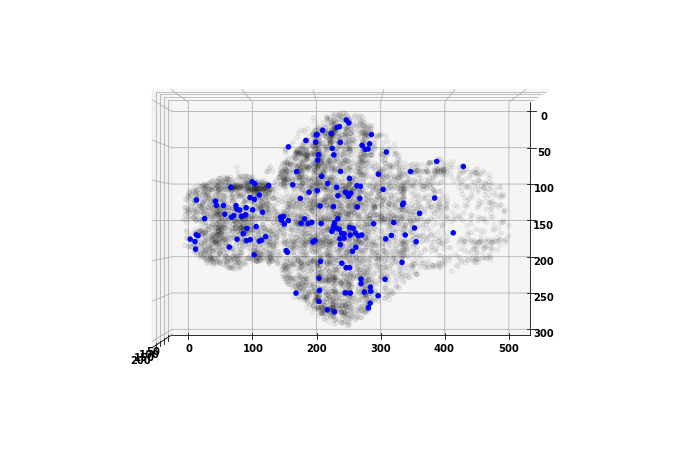

155


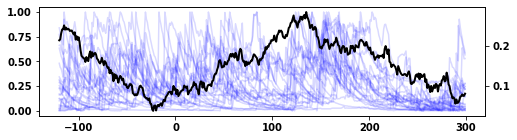

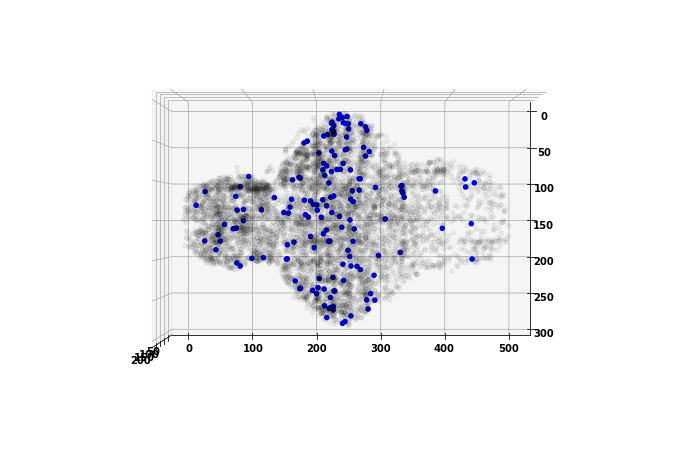

152


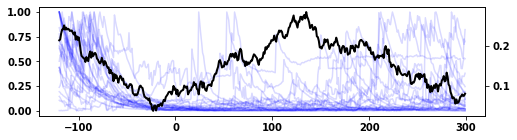

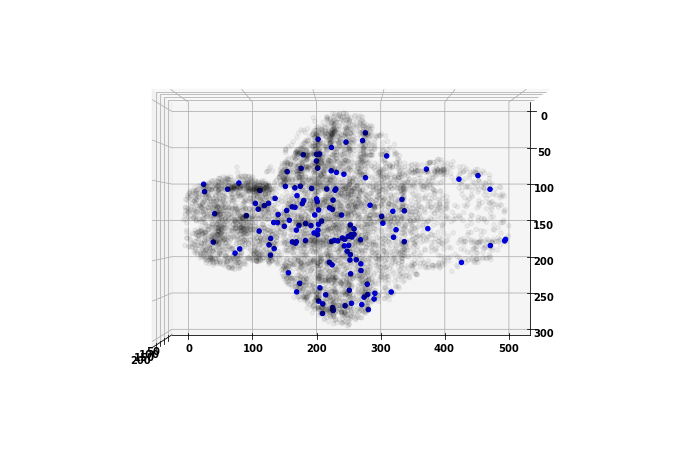

140


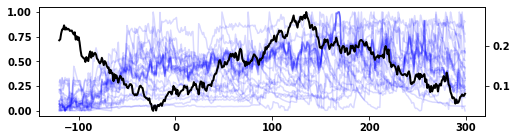

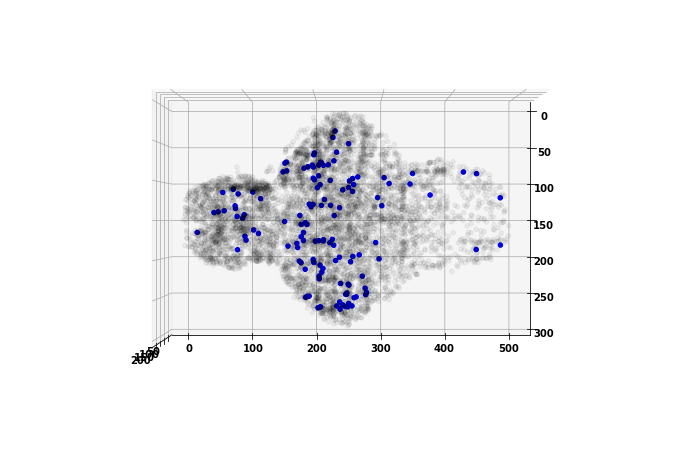

134


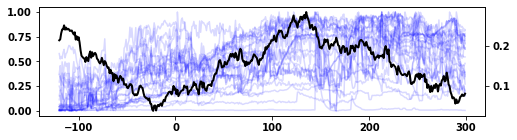

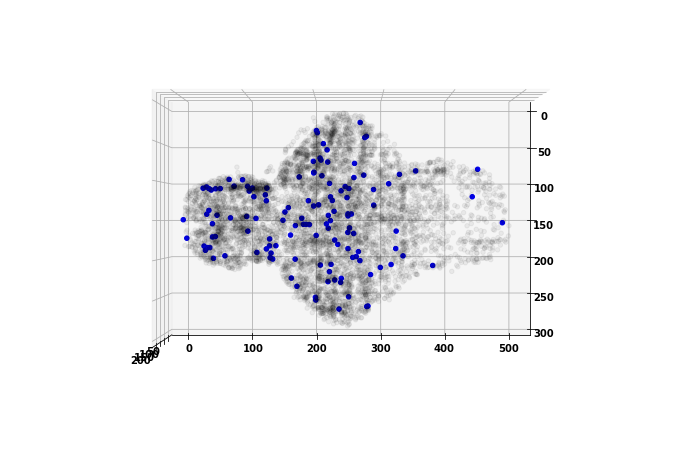

129


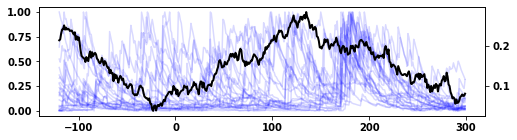

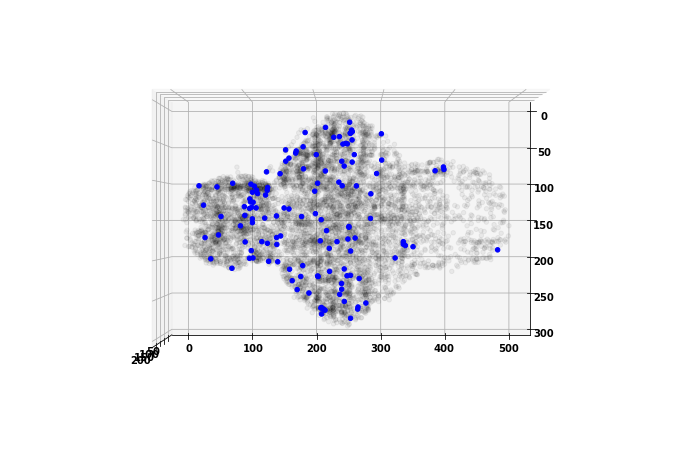

128


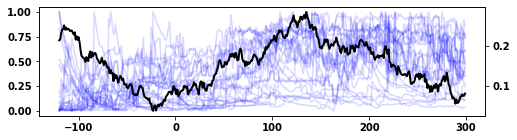

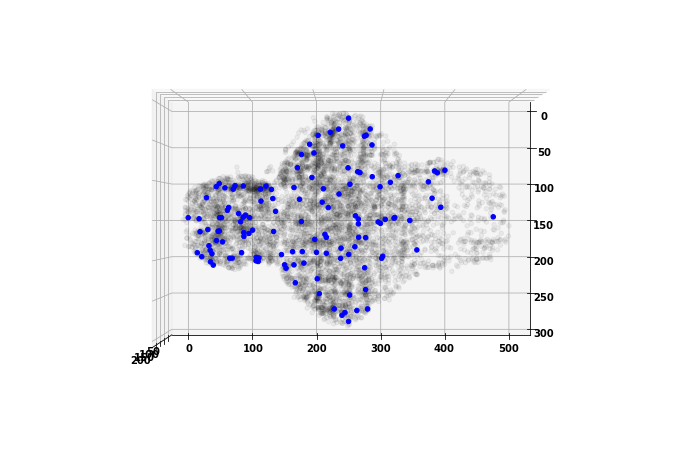

127


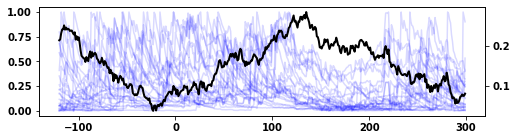

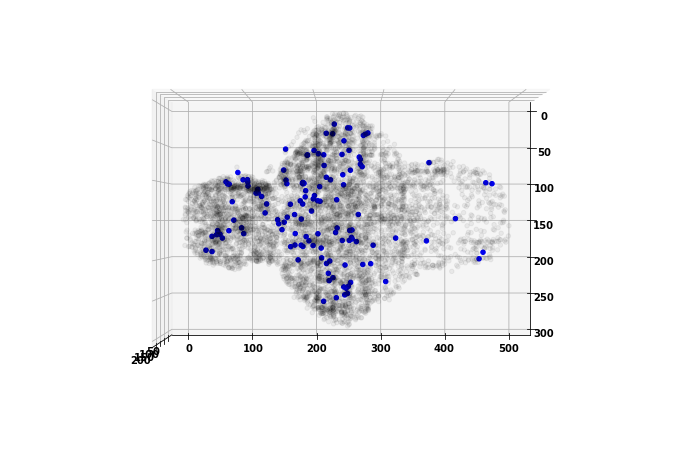

127


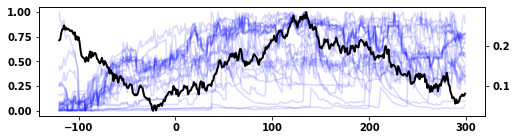

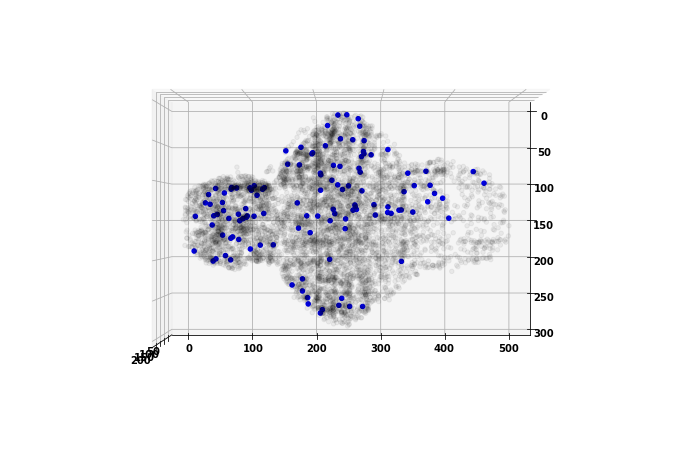

119


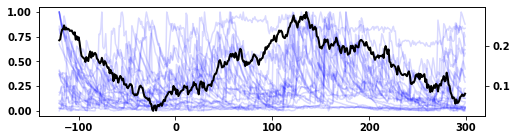

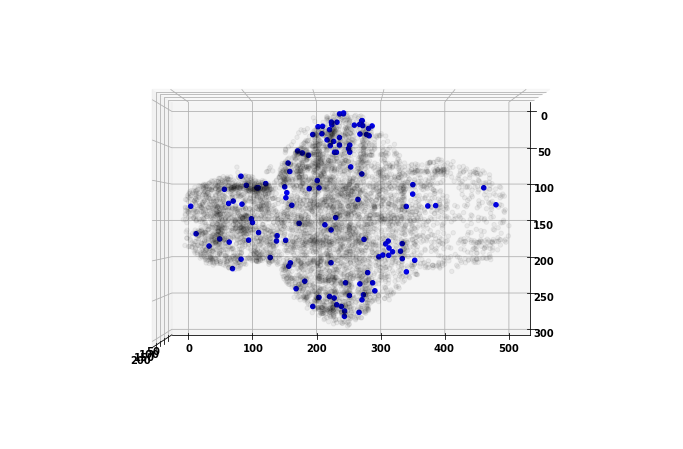

116


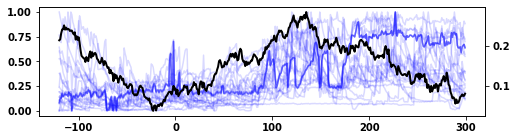

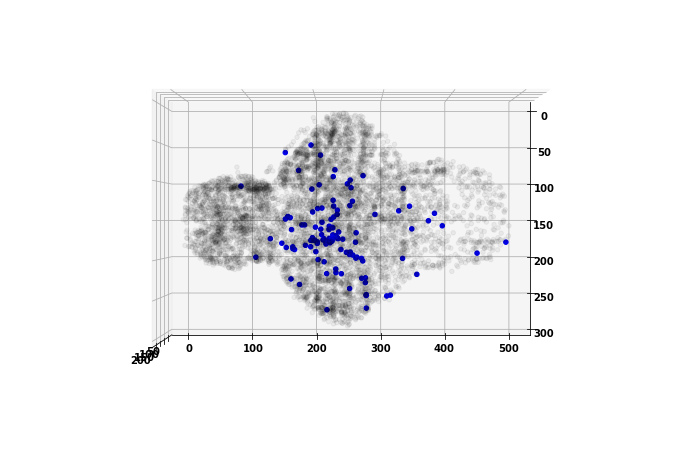

112


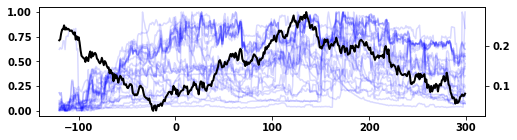

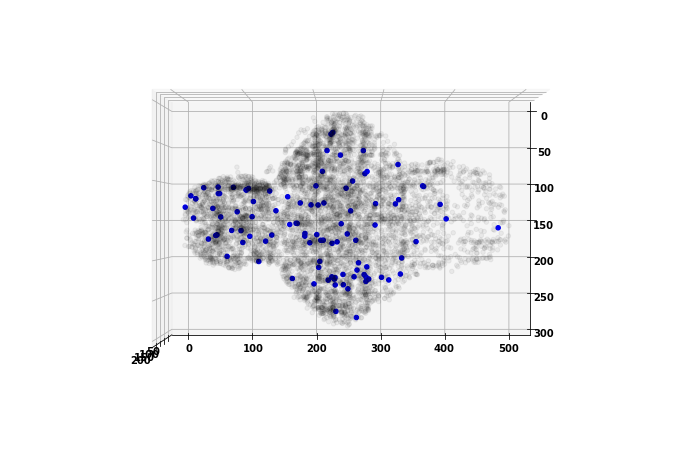

100


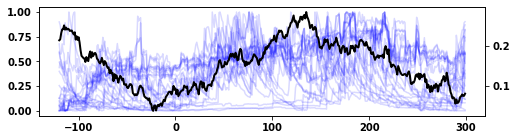

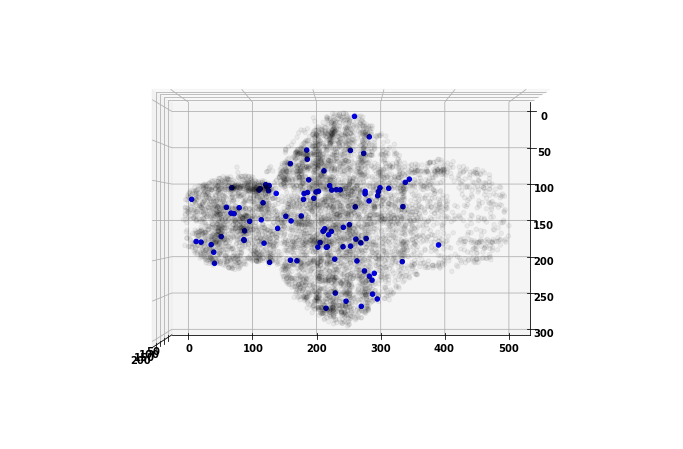

93


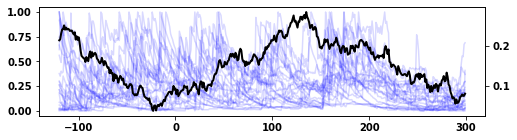

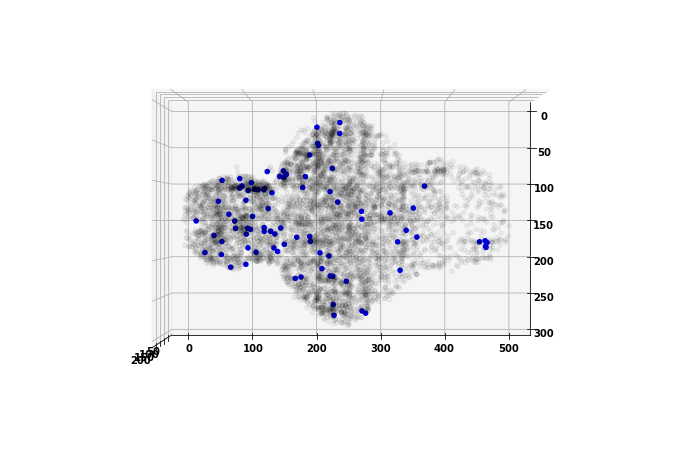

86


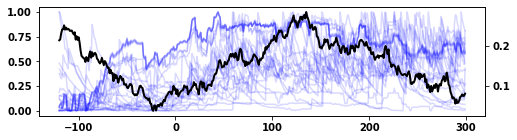

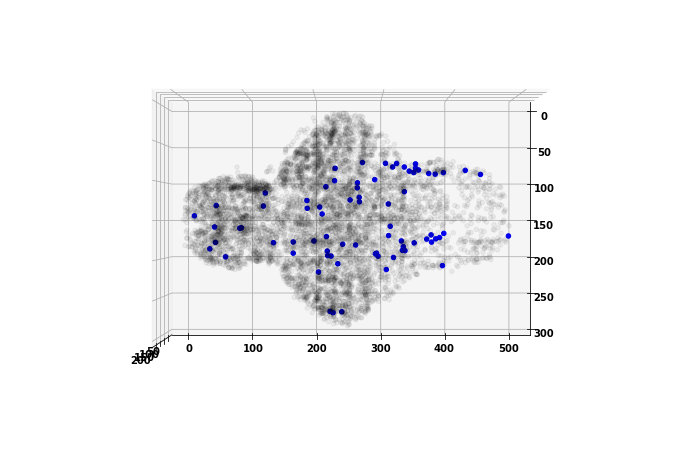

75


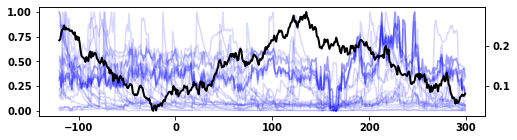

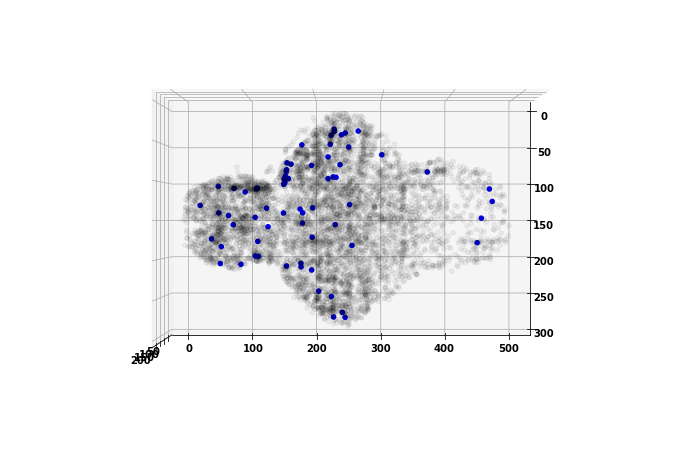

69


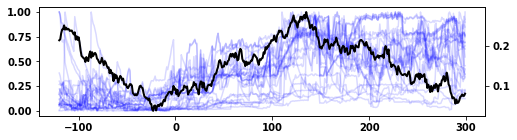

In [353]:
key = 25
X1 = baseline_superhub_outputs

#def plot_superhub_subnetworks(spatial_coords, traces, key, valid_idxs, sorted_idxs, raster, cluster_ids, view, colors=None, plot=True):

#baseline_neurons_per_state = plot_superhub_subnetworks(coords, traces, key, X1[key]['valid idxs'], X1[key]['oslabels'], X1[key]['sorted raster'], X1[key]['tlabels'],
#                                                       [90,0], colors='b', plot=False)


baseline_neurons_per_state, baseline_distances = plot_ensembles(coords, traces, key, X1[key]['valid idxs'],X1[key]['oslabels'], X1[key]['sorted raster'], X1[key]['slabels'], 
                                                           [90,0], colors='b', plot=True)



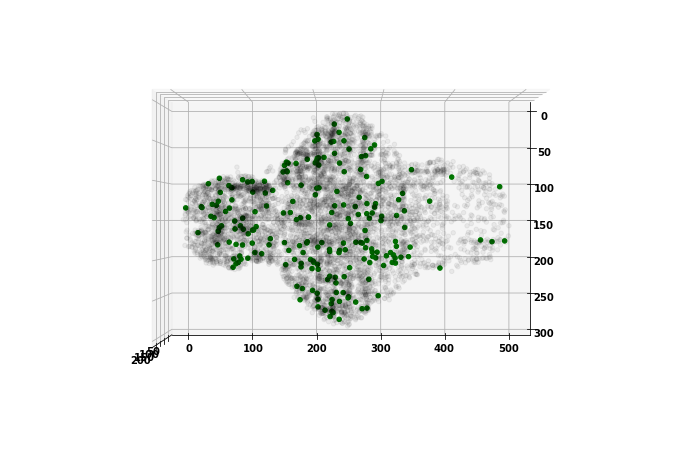

212


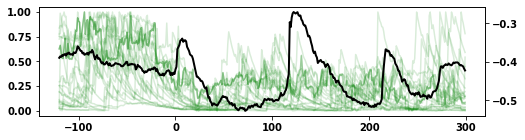

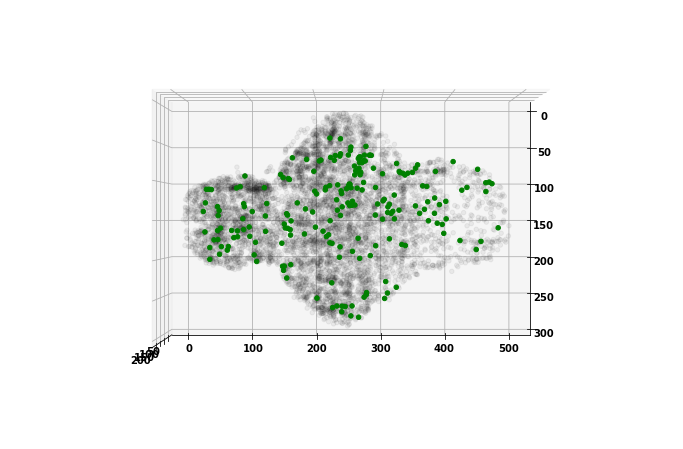

210


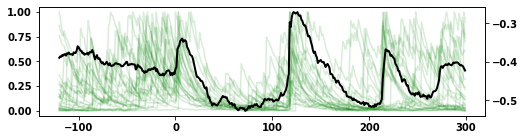

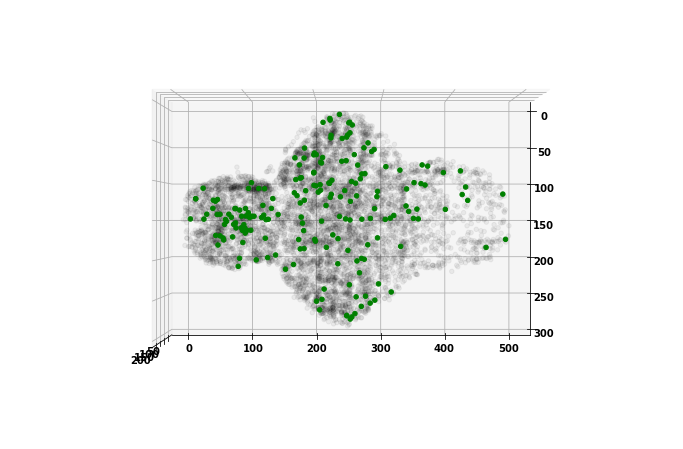

197


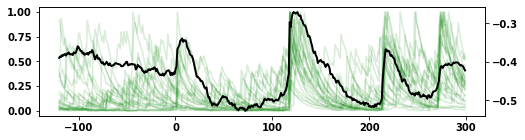

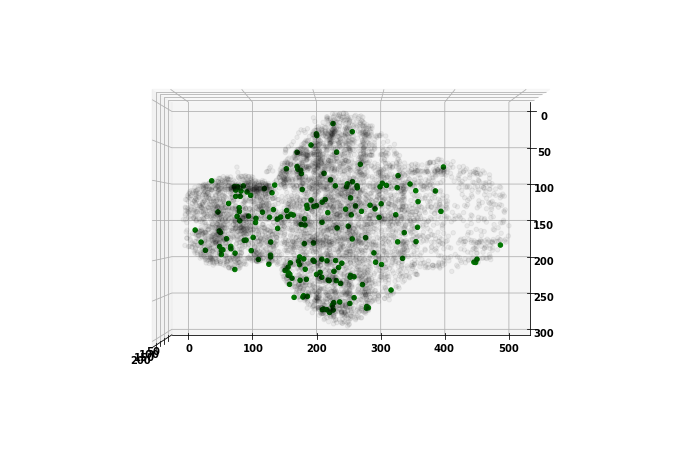

182


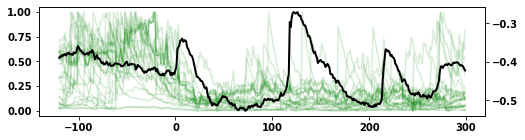

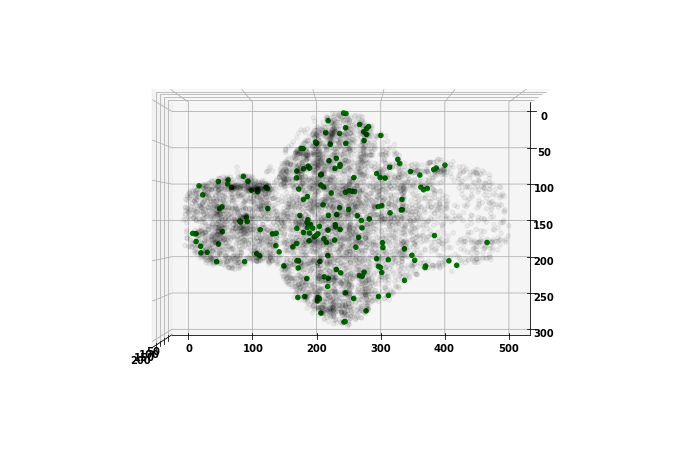

179


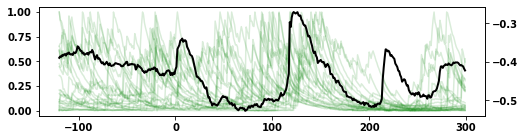

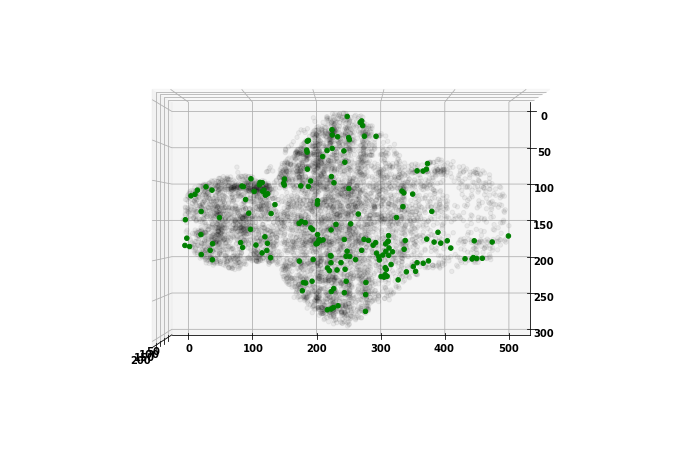

177


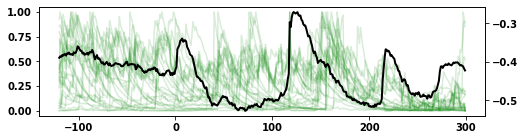

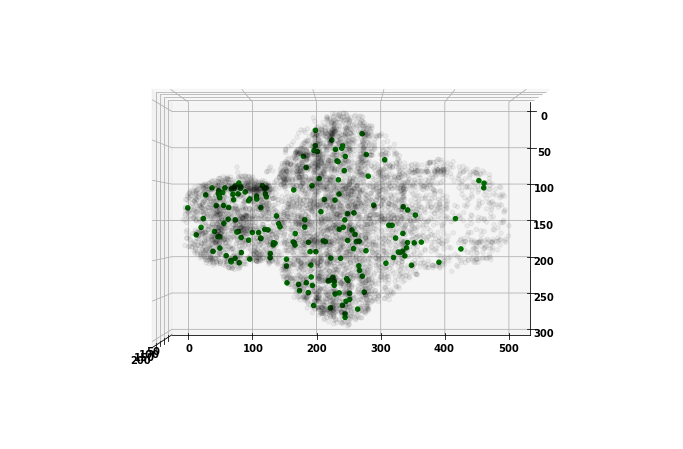

177


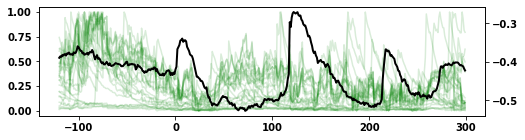

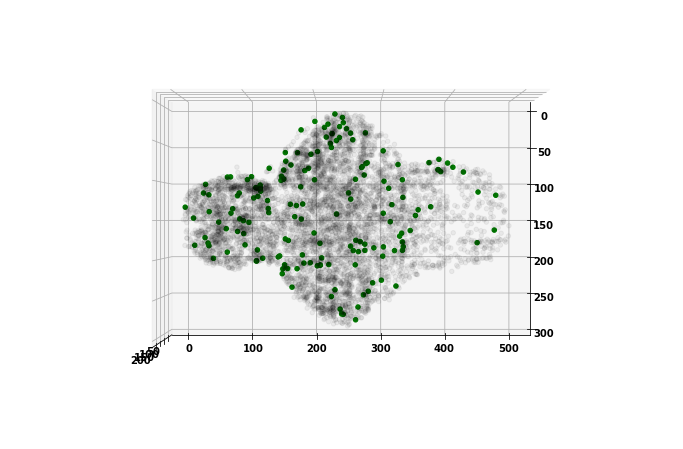

164


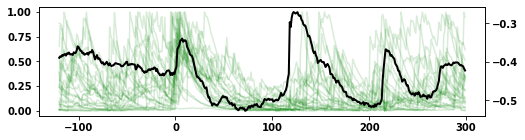

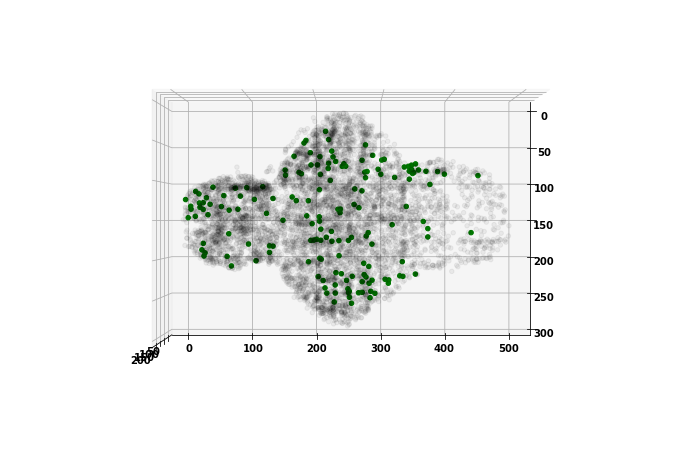

162


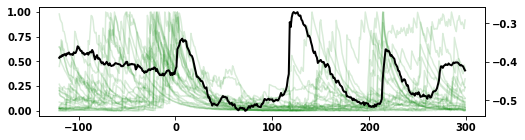

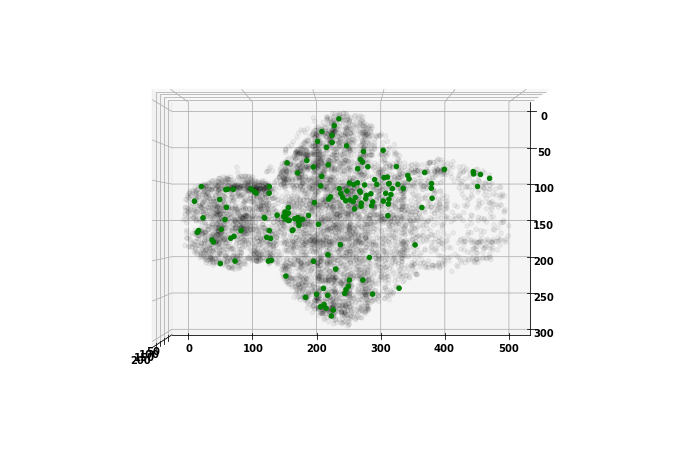

148


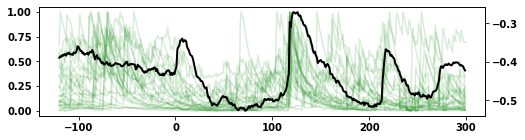

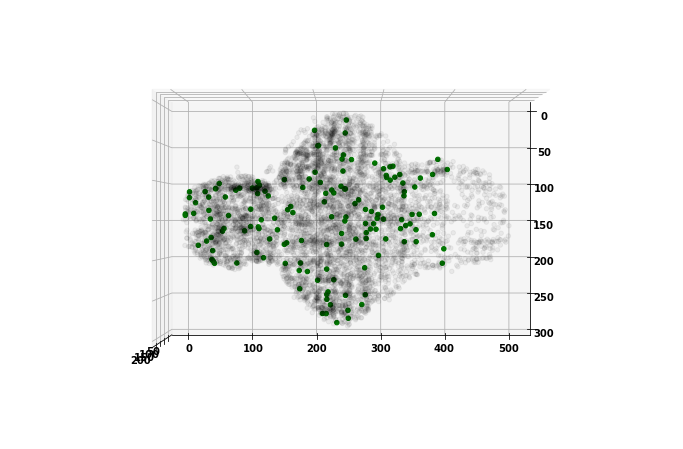

147


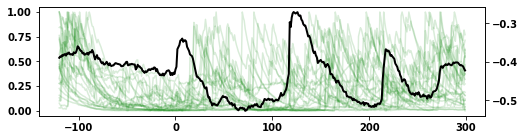

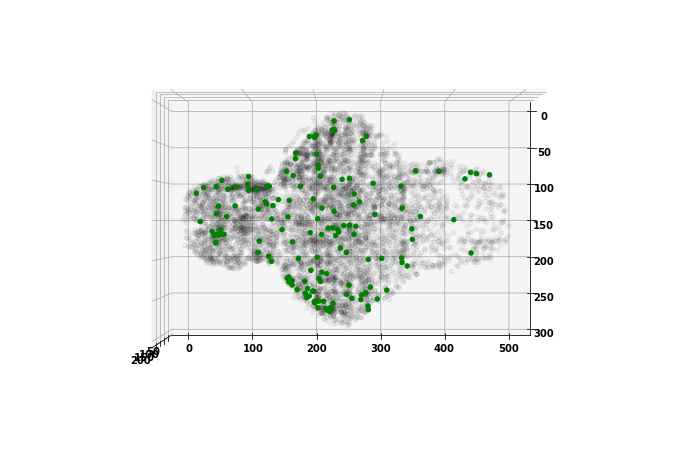

143


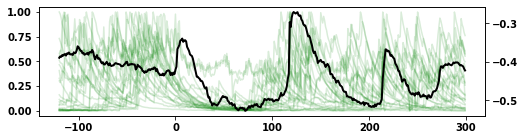

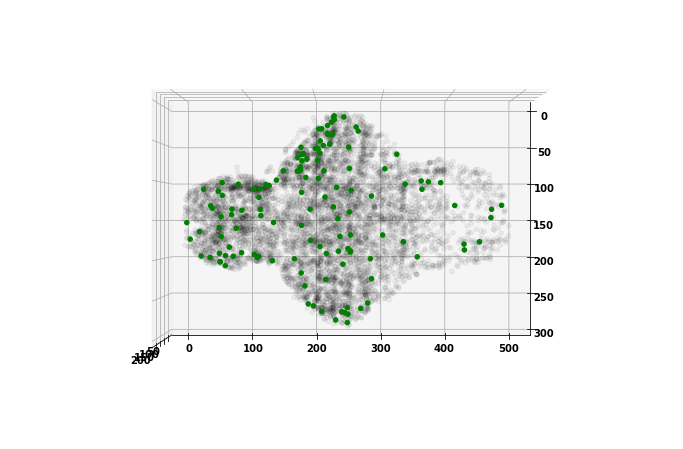

132


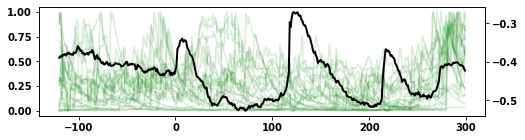

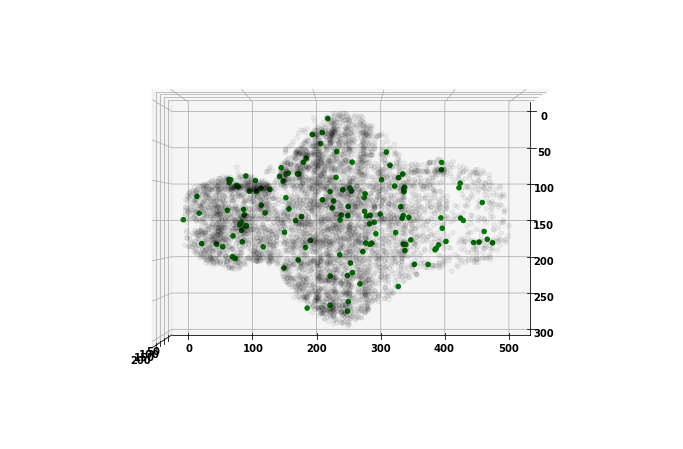

130


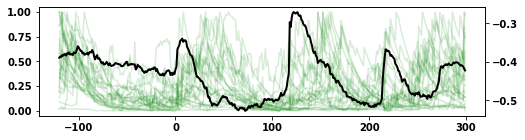

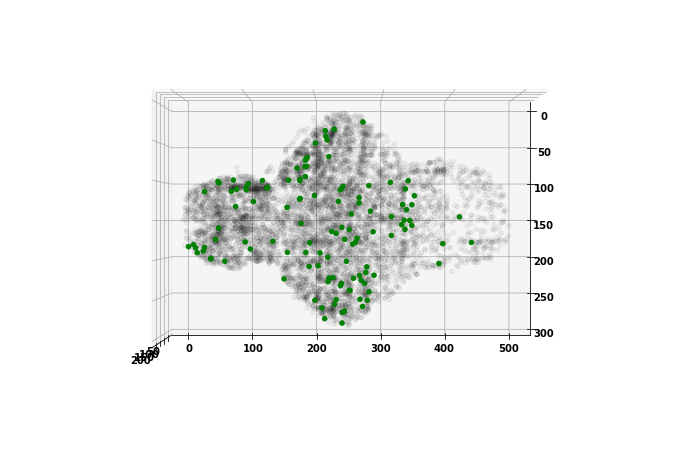

120


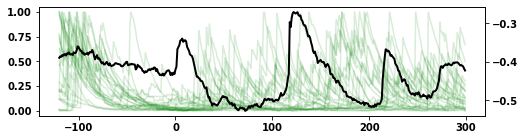

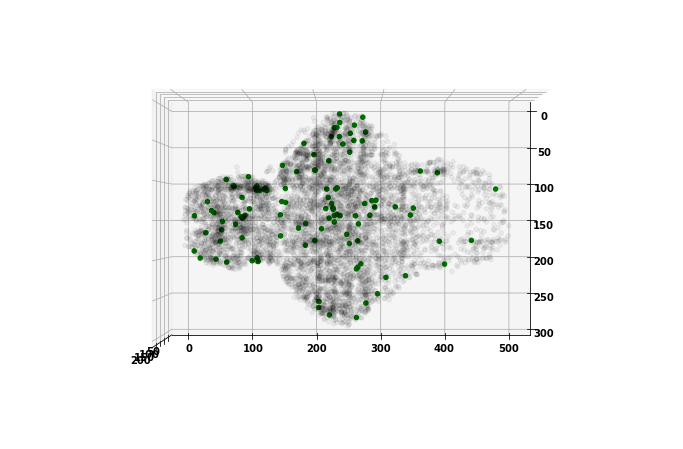

109


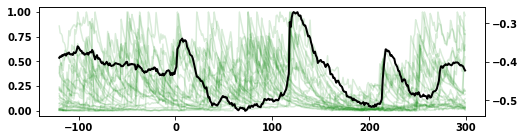

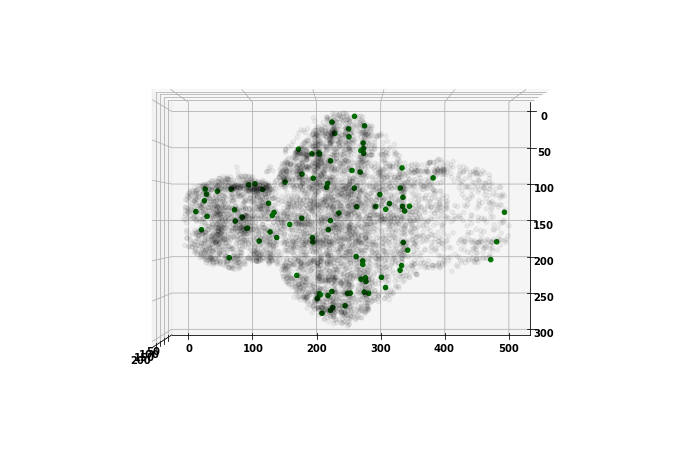

94


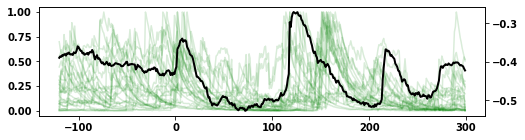

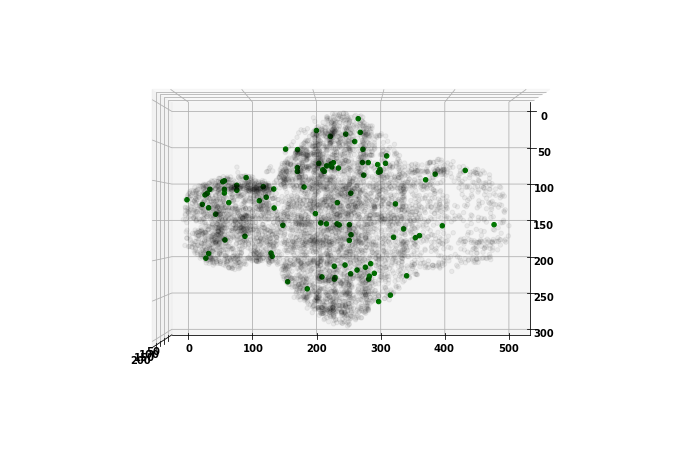

93


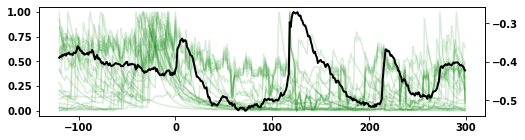

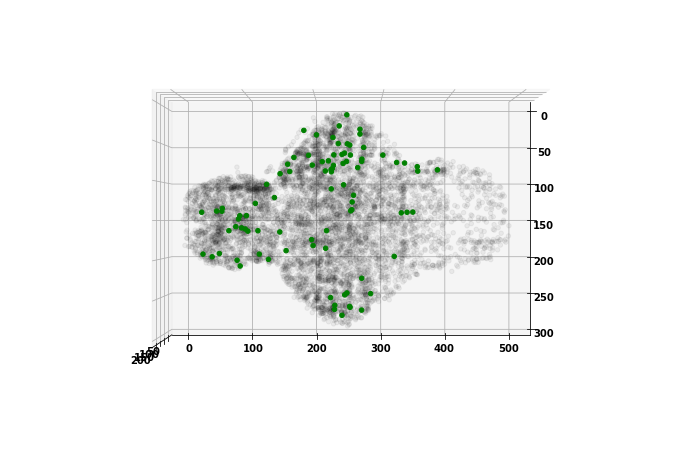

89


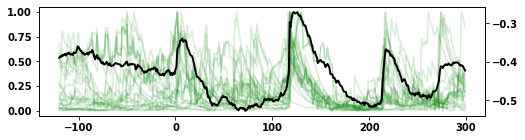

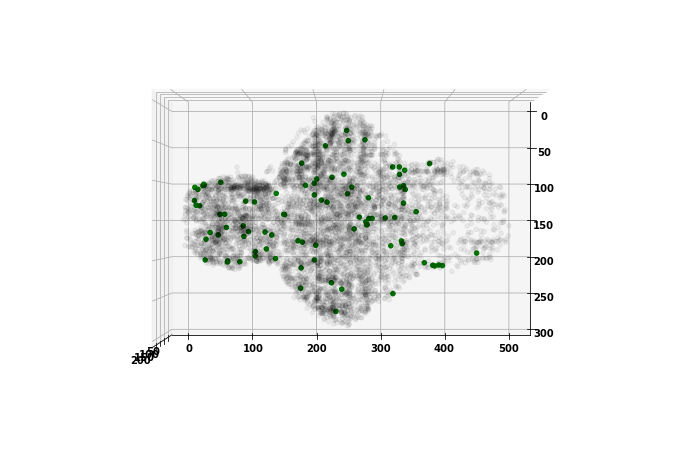

87


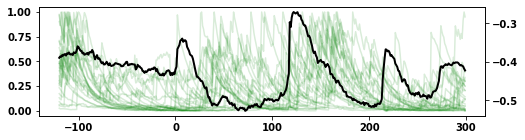

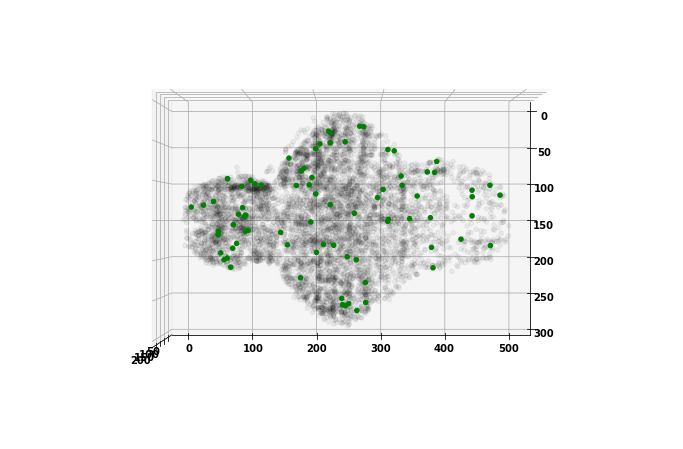

79


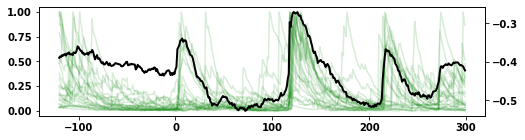

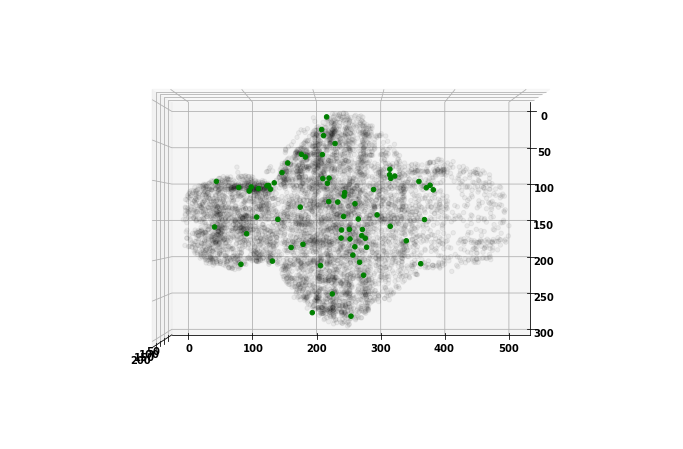

67


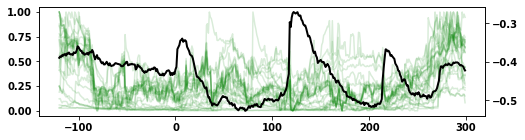

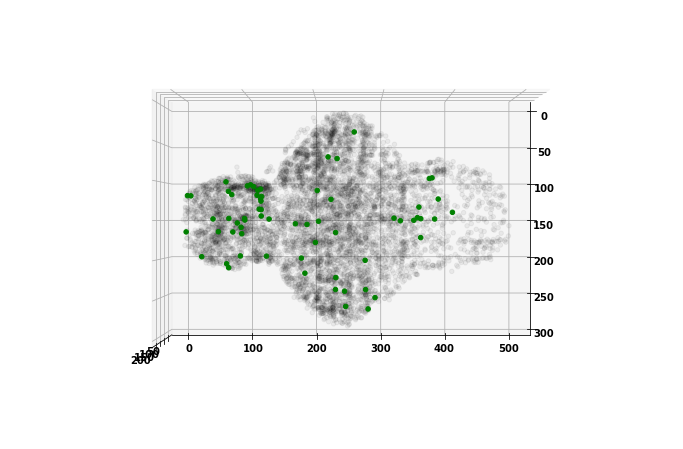

65


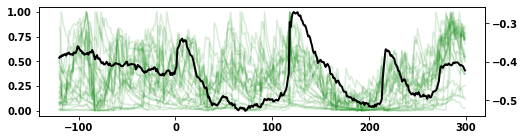

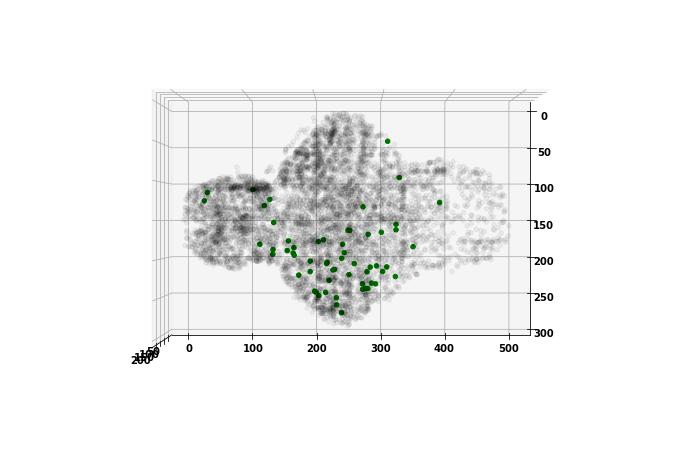

60


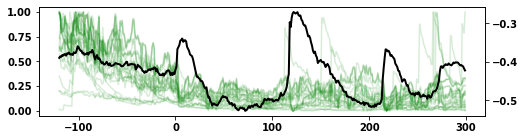

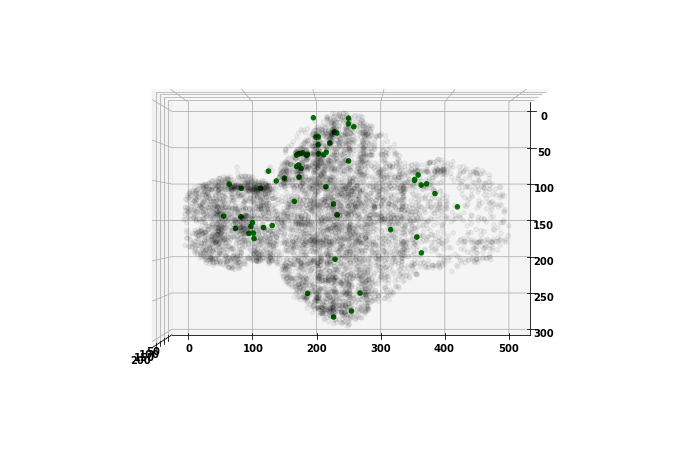

59


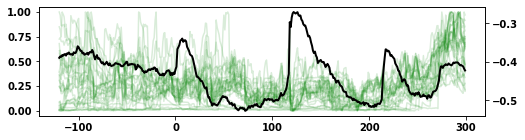

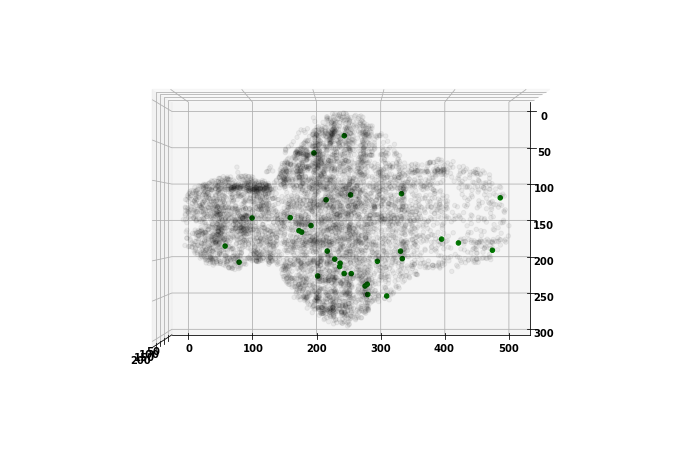

30


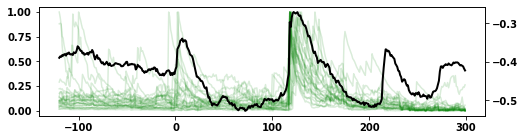

In [352]:
key = 1100
X2 = presz_superhub_outputs
#presz_neurons_per_state = plot_superhub_subnetworks(coords, traces, key, X2[key]['valid idxs'], X2[key]['oslabels'], X2[key]['raster'], X2[key]['tlabels'], 
#                                                    [90,0], colors='r', plot=False)

presz_neurons_per_state, presz_distances = plot_ensembles(coords, traces, key, X2[key]['valid idxs'], X2[key]['oslabels'], X2[key]['sorted raster'], X2[key]['slabels'], 
                                                        [90,0], colors='g', plot=True)


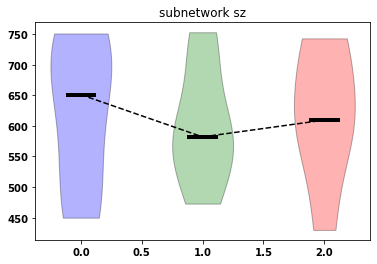

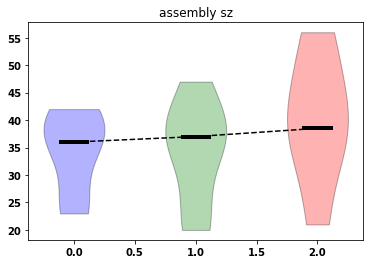

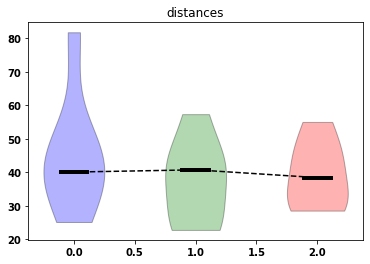

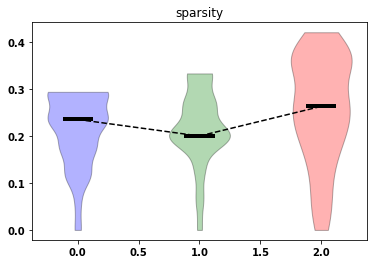

In [589]:
def vplots(X, keys, idx, title):

    data2plot = []
    for key in keys:
        data2plot.append(X[key][idx])

    fig, ax = plt.subplots()
    vplot = ax.violinplot(data2plot, showmedians=True, showextrema=False,
                           positions=range(len(keys)))
    plt.title(title)
    if len(keys) == 3:
        colors = ['b', 'g', 'r']
        for patch, color in zip(vplot['bodies'], colors):
            patch.set_facecolor(color)
            patch.set_edgecolor('k')

        for partname in ['cmedians']:
            vp = vplot[partname]
            vp.set_edgecolor('k')
            vp.set_linewidth(4)
        plt.plot([0,1], [np.median(data2plot[0]),np.median(data2plot[1])], color='k', linestyle='--')
        plt.plot([1,2], [np.median(data2plot[1]),np.median(data2plot[2])], color='k', linestyle='--')        
    
    plt.show()


#return neurons_per_subnetwork, neurons_per_assembly, assembly_distances


vplots(subnetwork_data, keys, 0, 'subnetwork sz')
vplots(subnetwork_data, keys, 1, 'assembly sz')
vplots(subnetwork_data, keys, 2, 'distances')
vplots(subnetwork_data, keys, 3, 'sparsity')
